# wait to run until after running ../18.ipynb

need to create /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/gf_offsets_to_future.pkl

<a id='home'></a>
### purpose

create figures from future RONA, and correlations between future RONA and future GradientForests


### outline

1. [load population data](#popdata)
1. [load offset-related data](#load)
1. [create slope graphs to show how rank changes among top 5 envs](#slope)
1. [create bubble plots to show difference in rank between RONA and GF](#bubble)
1. [compare rank correlation between RONA and GF offset estimates](#compare)

In [1]:
from pythonimports import *
from myfigs import slope_graph, create_cmap, gradient_image, save_pdf

import seaborn as sns
from scipy.stats import ttest_rel
from IPython.display import Image
from pycircos import Garc, Gcircle
import matplotlib
import matplotlib.colors as mcolors
from matplotlib.colors import rgb2hex
from matplotlib.colors import ColorConverter
sns.set_style("white")
sns.set_style("ticks")

# timer
t1 = dt.now()

# outfiles from ../09_RONA.ipynb
ronadir = '/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona'
figdir = op.join(ronadir, 'figs')

latest_commit()
session_info.show()

##################################################################
Today:	January 09, 2024 - 08:47:20
python version: 3.8.5
conda env: newpy385

Current commit of pythonimports:
commit 03d76f7a992130f4b94ac34a09ad439e918d3044  
Author: Brandon Lind <lind.brandon.m@gmail.com>  
Date:   Fri Jun 9 09:42:21 2023 -0400
##################################################################



<a id='popdata'></a>

# 1. load population data

[top](#home)

In [2]:
# from ../09_RONA.ipynb
snpfiles = {
    'jp' : '/data/projects/pool_seq/pangenome/JP_pangenome/JP_pooled/snpsANDindels/without_p24/03_maf-p05_RD-recalculated/JP_pooled-varscan_all_bedfiles_SNP_without-p24_maf_RD-recalculated.txt',
    'fdi' : '/data/projects/pool_seq/DF_datasets/DF_pooled_GEA/DF_pooled/snpsANDindels/interior_variety_without-p6/03_maf-p05_RD-recalculated_FDI/DF_pooled-varscan_all_bedfiles_SNP_FDI_maf_RD-recalculated.txt',
    'fdc' : '/data/projects/pool_seq/DF_datasets/DF_pooled_GEA/DF_pooled/snpsANDindels/coastal_variety_with-p6/03_maf-p05_RD-recalculated_FDC/DF_pooled-varscan_all_bedfiles_SNP_FDC_maf_RD-recalculated.txt',
    'combined' : '/data/projects/pool_seq/DF_datasets/DF_pooled_GEA/DF_pooled/snpsANDindels/combined_varieties/03_maf-p05_RD-recalculated_both/DF_pooled-varscan_all_bedfiles_SNP_both-varieties_maf_RD-recalculated.txt'
}

In [3]:
# from ../09_RONA.ipynb
envfiles = {
    'jp' : '/data/projects/pool_seq/environemental_data/jp_rm_p24/jp_no-p24_raw_env-19variables.txt',
    'fdi' : '/data/projects/pool_seq/environemental_data/change_p6/df_interior-naturalpops_raw_env-19variables_change-p6.txt',
    'fdc' : '/data/projects/pool_seq/environemental_data/change_p6/df_coastal-naturalpops_raw_env-19variables_change-p6.txt',
    'combined' : '/data/projects/pool_seq/environemental_data/change_p6/df_ALL-naturalpops_raw_env-19variables_change-p6.txt'
}

In [4]:
# doug-fir pop colors
df_colors = pd.read_table('/data/projects/pool_seq/environemental_data/change_p6/doug-fir_colored_pops.txt')
df_colors.loc[df_colors['our_id']=='DF_p40', ['group', 'group_color']] = 'North BC', '#f205f4'  # as in ../01_split_training_and_testing.ipynb
color_dict = dict(zip(df_colors['our_id'], df_colors['group_color']))

In [5]:
# read in the envdata, apply pop colors
envdata = {}
all_colors = {}
for spp, f in envfiles.items():
    envdata[spp] = pd.read_table(f)
    envdata[spp].index = envdata[spp]['our_id'].tolist()
    if spp != 'jp':
        envdata[spp]['group_color'] = envdata[spp]['our_id'].map(color_dict)
    all_colors[spp] = dict(zip(envdata[spp]['our_id'], envdata[spp]['group_color']))
    print(ColorText(spp).bold())
    display(envdata[spp].head())

jp


,id1,id2,our_id,LAT,LONG,Elevation,AHM,CMD,DD5,DD_0,EMT,EXT,Eref,FFP,MAP,MAT,MCMT,MSP,MWMT,NFFD,PAS,SHM,TD,bFFP,eFFP,group_color
JP_p98,9150251,38,JP_p98,54.3333,-106.6333,537,21.2,181,1273,2217,-46.0,34.7,534,103,461,-0.2,-20.1,305,16.6,149,129,54.4,36.7,148,251,green
JP_p73,3273,22,JP_p73,44.4200,-84.6800,359,22.0,241,1956,835,-34.1,36.6,745,131,732,6.1,-8.0,395,19.8,163,140,50.0,27.8,141,271,blue
JP_p97,8060006,37,JP_p97,56.1167,-116.9167,636,23.5,242,1188,2009,-44.3,34.8,556,90,432,0.2,-19.8,272,15.4,138,133,56.5,35.1,151,241,green
JP_p60,3260,17,JP_p60,46.7200,-84.3900,203,16.5,135,1557,1116,-36.8,34.3,599,123,848,4.0,-10.7,397,17.6,156,265,44.2,28.3,147,271,blue
JP_p100,9040116,40,JP_p100,55.7667,-97.8167,205,13.3,130,1003,2956,-49.7,35.2,448,82,506,-3.3,-24.9,315,15.7,106,191,49.9,40.6,163,245,green


fdi


,prov,our_id,Variety,LONG,LAT,Elevation,MAT,MWMT,MCMT,TD,MAP,MSP,AHM,SHM,DD_0,DD5,NFFD,bFFP,eFFP,FFP,PAS,EMT,EXT,Eref,CMD,group,group_color
DF_p3,3,DF_p3,FDI,-115.62,50.54,1525,1.6,13.4,-10.7,24.1,630,321,18.5,41.8,1242,929,130,171,244,73,261,-43.3,32.6,548,151,Eastern BC,#22ff00
DF_p4,4,DF_p4,FDI,-122.33,52.04,900,3.9,15.3,-9.2,24.5,423,196,32.9,78.2,919,1270,158,154,255,101,149,-40.2,34.9,598,350,North BC,#f205f4
DF_p5,5,DF_p5,FDI,-119.05,49.02,853,6.0,17.7,-6.2,23.9,367,171,43.8,103.6,637,1650,182,142,265,123,100,-34.8,37.7,732,497,Tri-state,#995bbe
DF_p7,7,DF_p7,FDI,-122.13,53.98,684,3.4,15.0,-10.3,25.3,880,341,15.2,43.9,1031,1239,162,150,256,106,372,-40.5,33.6,552,174,North BC,#f205f4
DF_p8,8,DF_p8,FDI,-124.38,54.35,850,2.1,13.7,-11.3,25.0,572,235,21.1,58.4,1210,991,143,164,250,86,262,-42.3,32.4,521,240,North BC,#f205f4


fdc


,prov,our_id,Variety,LONG,LAT,Elevation,MAT,MWMT,MCMT,TD,MAP,MSP,AHM,SHM,DD_0,DD5,NFFD,bFFP,eFFP,FFP,PAS,EMT,EXT,Eref,CMD,group,group_color
DF_p1,1,DF_p1,FDC,-126.63,49.78,225,8.4,15.6,2.3,13.3,4004,778,4.6,20.0,143,1644,277,115,301,186,242,-18.3,33.3,606,10,Western BC,#a6cee3
DF_p2,2,DF_p2,FDC,-122.73,50.32,550,6.1,16.4,-4.4,20.8,1029,225,15.6,73.0,518,1521,202,135,272,137,330,-30.9,35.2,659,307,Lower Mainland,#33a02c
DF_p6,6,DF_p6,FDC,-125.75,52.28,460,5.1,15.8,-7.3,23.2,827,180,18.2,87.8,741,1440,172,149,257,108,351,-38.4,35.0,667,392,Western BC,#a6cee3
DF_p10,10,DF_p10,FDC,-125.33,50.00,152,8.3,16.6,0.9,15.7,1502,301,12.2,55.0,182,1727,265,116,294,178,128,-20.5,34.8,651,192,Western BC,#a6cee3
DF_p11,11,DF_p11,FDC,-123.97,48.95,732,5.8,14.4,-1.1,15.5,2204,301,7.2,47.9,336,1203,225,133,286,153,547,-24.1,32.5,529,149,Western BC,#a6cee3


combined


,prov,our_id,Variety,LONG,LAT,Elevation,MAT,MWMT,MCMT,TD,MAP,MSP,AHM,SHM,DD_0,DD5,NFFD,bFFP,eFFP,FFP,PAS,EMT,EXT,Eref,CMD,group_color
DF_p1,1,DF_p1,FDC,-126.63,49.78,225,8.4,15.6,2.3,13.3,4004,778,4.6,20.0,143,1644,277,115,301,186,242,-18.3,33.3,606,10,#a6cee3
DF_p2,2,DF_p2,FDC,-122.73,50.32,550,6.1,16.4,-4.4,20.8,1029,225,15.6,73.0,518,1521,202,135,272,137,330,-30.9,35.2,659,307,#33a02c
DF_p3,3,DF_p3,FDI,-115.62,50.54,1525,1.6,13.4,-10.7,24.1,630,321,18.5,41.8,1242,929,130,171,244,73,261,-43.3,32.6,548,151,#22ff00
DF_p4,4,DF_p4,FDI,-122.33,52.04,900,3.9,15.3,-9.2,24.5,423,196,32.9,78.2,919,1270,158,154,255,101,149,-40.2,34.9,598,350,#f205f4
DF_p5,5,DF_p5,FDI,-119.05,49.02,853,6.0,17.7,-6.2,23.9,367,171,43.8,103.6,637,1650,182,142,265,123,100,-34.8,37.7,732,497,#995bbe


In [6]:
# before revision
# envs = envdata['combined'].columns[-20:-1]
# print(len(envs))

# after revision - hard-code envs
envs = ['MAT', 'MWMT', 'MCMT', 'TD', 'MAP', 'MSP', 'AHM', 'SHM',
        'DD_0', 'DD5', 'NFFD', 'bFFP', 'eFFP', 'FFP', 'PAS', 'EMT', 'EXT',
        'Eref', 'CMD']

assert len(envs) == 19
envs

['MAT',
 'MWMT',
 'MCMT',
 'TD',
 'MAP',
 'MSP',
 'AHM',
 'SHM',
 'DD_0',
 'DD5',
 'NFFD',
 'bFFP',
 'eFFP',
 'FFP',
 'PAS',
 'EMT',
 'EXT',
 'Eref',
 'CMD']

In [7]:
envdata[spp]['MAT']

DF_p1      8.4
DF_p2      6.1
DF_p3      1.6
DF_p4      3.9
DF_p5      6.0
          ... 
DF_p80    11.0
DF_p81    10.1
DF_p82     9.4
DF_p83     9.2
DF_p84     9.2
Name: MAT, Length: 73, dtype: float64

<a id='load'></a>
# 2. load offset-related data

[top](#home)

##### RONA

In [8]:
# load RONA estimates
# created in ../16_future_RONA.ipynb
pkl = op.join(ronadir, 'future_rona.pkl')
rona = pklload(pkl)

In [9]:
# load the environments calculated to be most different between current and future scenarios (t-test pvals)
# created in ../16_future_RONA.ipynb
pkl = op.join(ronadir, 'canonical_future_efdict.pkl')
canonical_efs = pklload(pkl)

In [10]:
# # load all environment info
# # created in ../16_future_RONA.ipynb
# pkl = op.join(ronadir, 'future_efdict.pkl')
# ef_fut = pklload(pkl)

In [11]:
# other lists of envs to iterate
cbst_envs = defaultdict(lambda: ['MAT', 'MCMT', 'TD', 'MAP', 'MSP', 'DD5', 'EMT'])

prov_envs = {
    'jp': ['MAT', 'SHM', 'TD'],
    'fdi': ['MAT', 'AHM'],
    'fdc': ['MAT', 'AHM'],
    'combined': ['MAT', 'AHM']
}

cbst_envs['well hello there!']

['MAT', 'MCMT', 'TD', 'MAP', 'MSP', 'DD5', 'EMT']

In [12]:
# gather RONA into something more useful
method = 'wza'
setname = 'real'
myrona = wrap_defaultdict(list, 2)  # muh muh muh myyyy pyRONA
for spp,envdict in rona.items():
    for env,rcpdict in envdict.items():
        rcp_dfs = []
        for rcp,popdict in rcpdict.items():
            ronadict = OrderedDict()
            for pop in popdict.keys():
                ronadict[pop] = popdict[pop]['wza']['real']
            rcp_dfs.append(
                pd.DataFrame(ronadict, index=[rcp]).T
            )
        myrona[spp][env] = pd.concat(rcp_dfs, axis=1)
        
myrona[spp][env].head()

,NA_ENSEMBLE_rcp45_2050s,NA_ENSEMBLE_rcp45_2080s,NA_ENSEMBLE_rcp85_2050s,NA_ENSEMBLE_rcp85_2080s
DF_p1,0.132027,0.142883,0.145792,0.184811
DF_p18,0.193039,0.209206,0.217402,0.280472
DF_p19,0.232775,0.252979,0.261158,0.319924
DF_p2,0.107462,0.101958,0.098801,0.093297
DF_p20,0.188885,0.204921,0.213050,0.271696


##### Gradient Forests

In [13]:
# load gradient forests offsets to future climates (fit from models using WZA loci and all pops)
# created in ../18_gf_future_offset_maps.ipynb
gf_offsets = pklload(
    '/data/projects/pool_seq/phenotypic_data/offset_misc_files/results/gradient_forests/gf_offsets_to_future.pkl'
)

<a id='future'></a>
# get future climate data for correlations

[top](#home)

(from ../16_future_RONA.ipynb)

In [14]:
# functions from ../11_validate_GF_offset_predictions.ipynb
# modified for readability (eg "offset" -> "future") 
    # - also replacing latitude/longitude with lat/lon because of the way ...
        # ... I saved WGS84 projected data in ../03_clip_climate_data.ipynb

def read_future_file(future_file, x_dim="latitude", y_dim="longitude"):
    """Read in netcdf file."""
    import xarray as xr
    import rioxarray

    ds = xr.open_dataset(future_file)
    ds.rio.set_spatial_dims(x_dim=x_dim, y_dim=y_dim, inplace=True)
    ds.rio.write_crs("epsg:4326", inplace=True)
    
#     layers = [var for var in list(ds.variables) if var not in ['crs', 'longitude', 'latitude']]
    layers = [var for var in list(ds.variables) if var not in ['crs', x_dim, y_dim]]
    assert len(layers) == 1
    
    layer = layers[0]
    vals = ds[layer][:,:]
#     lons = ds[layer]['longitude']
    lons = ds[layer][x_dim]
#     lats = ds[layer]['latitude']
    lats = ds[layer][y_dim]
    
    return ds, layer, vals, lons, lats


# def get_offset_data(offset_file, envdata, latcol='LAT', loncol='LONG'):
def get_future_data(future_file, envdata, latcol='LAT', loncol='LONG', **kwargs):
    """Read in offset data from netCDF `future_file` for each of the pops in `envdata`."""
    import xarray as xr

    # read in offset data
    ds, layer, *args = read_future_file(future_file, **kwargs)

    # pull offset values directly from the shapefile
    target_lat = xr.DataArray(envdata[latcol], dims='points')
    target_lon = xr.DataArray(envdata[loncol], dims='points')
#     future_clim = ds[layer].sel(longitude=target_lon, latitude=target_lat, method='nearest').to_dataframe()
    future_clim = ds[layer].sel(lon=target_lon, lat=target_lat, method='nearest').to_dataframe()
    future_clim.index = envdata['our_id'].tolist()
    
    try:
        assert future_clim[future_clim.columns[-1]].isnull().sum() == 0
    except AssertionError as e:
        # there can be null vals if a population resides outside of the shapefile boundaries ...
        # ... when shapefiles have been used to clip climate data
        print(future_file, envdata.index)
        raise e

    return future_clim

In [15]:
envs

['MAT',
 'MWMT',
 'MCMT',
 'TD',
 'MAP',
 'MSP',
 'AHM',
 'SHM',
 'DD_0',
 'DD5',
 'NFFD',
 'bFFP',
 'eFFP',
 'FFP',
 'PAS',
 'EMT',
 'EXT',
 'Eref',
 'CMD']

In [16]:
# read in future climates

netcdf_dir = '/data/projects/pool_seq/environemental_data/new_netCDF_files'
rcpdirs = fs(netcdf_dir, pattern='NA_ENSEMBLE_rcp', dirs=True)

future_envs = wrap_defaultdict(None, 3)
for d in rcpdirs:
    rcp = op.basename(d)
            
    for env in pbar(envs, desc=rcp):
        if env == 'Elevation':  # elevation won't change too much, yuh know, so I don't need to test it
            continue
            
        nc = op.join(d, f'{env}_WGS84.nc')
        
        for spp, envdf in envdata.items():
            future_envs[spp][rcp][env] = get_future_data(nc, envdf, x_dim='lon', y_dim='lat')['Band1']

# combine envs to dataframe
future_clim = wrap_defaultdict(None, 2)
for spp, rcpdict in future_envs.items():
    for rcp, envdict in rcpdict.items():
        future_clim[spp][rcp] = pd.DataFrame(envdict)

# show example
print(spp, rcp)
future_clim[spp][rcp].head()

NA_ENSEMBLE_rcp85_2080s: 100%|███████████████| 19/19 [00:02<00:00,  7.04it/s]

combined NA_ENSEMBLE_rcp85_2080s


,MAT,MWMT,MCMT,TD,MAP,MSP,AHM,SHM,DD_0,DD5,NFFD,bFFP,eFFP,FFP,PAS,EMT,EXT,Eref,CMD
DF_p1,13.5,21.1,7.5,13.600000,4076.0,663.0,5.800000,31.799999,33.0,3153.0,354.0,23.0,348.0,326.0,27.0,-5.8,38.299999,707.0,86.0
DF_p2,11.9,23.6,0.7,22.900000,1064.0,196.0,20.600000,120.300003,158.0,2925.0,297.0,88.0,309.0,221.0,75.0,-19.1,42.299999,855.0,484.0
DF_p3,8.4,21.6,-4.7,26.299999,454.0,206.0,40.599998,104.599998,472.0,2312.0,214.0,120.0,279.0,159.0,84.0,-32.5,41.599998,797.0,481.0
DF_p4,9.1,21.6,-3.9,25.500000,472.0,190.0,40.599998,113.500000,385.0,2366.0,232.0,113.0,284.0,171.0,81.0,-30.6,41.500000,785.0,480.0
DF_p5,10.5,23.4,-1.3,24.700001,391.0,154.0,52.500000,152.000000,249.0,2640.0,249.0,113.0,292.0,179.0,40.0,-25.6,43.400002,876.0,608.0


<a id='slope'></a>
# 3. create slope graphs to show how rank changes among top 5 RONA envs

[top](#home)

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_NA_ENSEMBLE_rcp45_2050s_sig_envs_slope_graph.pdf


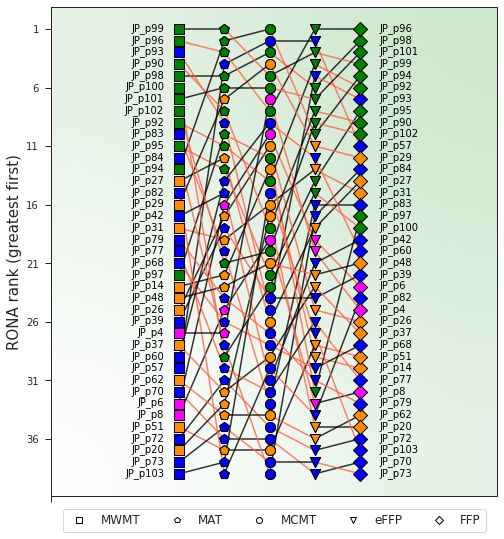

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_NA_ENSEMBLE_rcp45_2080s_sig_envs_slope_graph.pdf


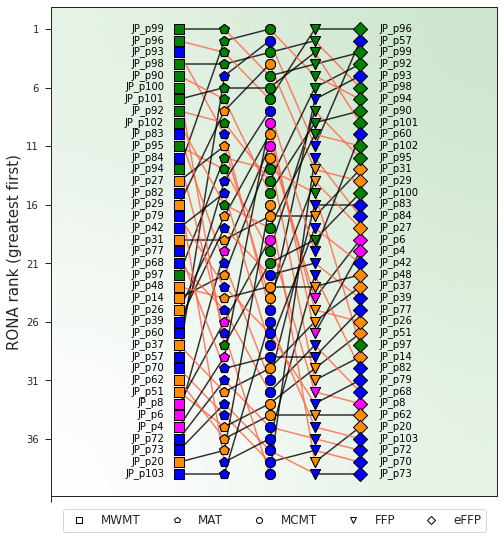

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_NA_ENSEMBLE_rcp85_2050s_sig_envs_slope_graph.pdf


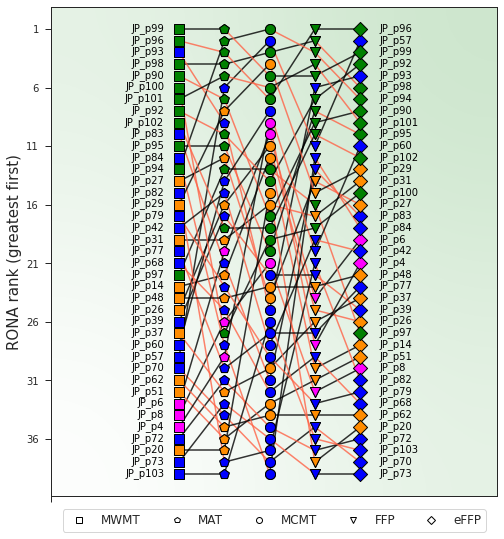

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_NA_ENSEMBLE_rcp85_2080s_sig_envs_slope_graph.pdf


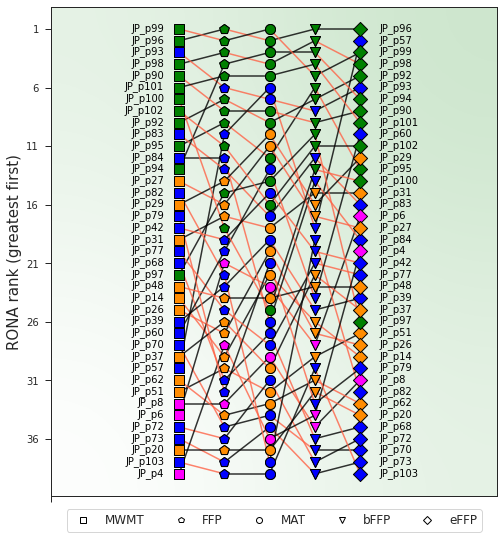

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_NA_ENSEMBLE_rcp45_2050s_sig_envs_slope_graph.pdf


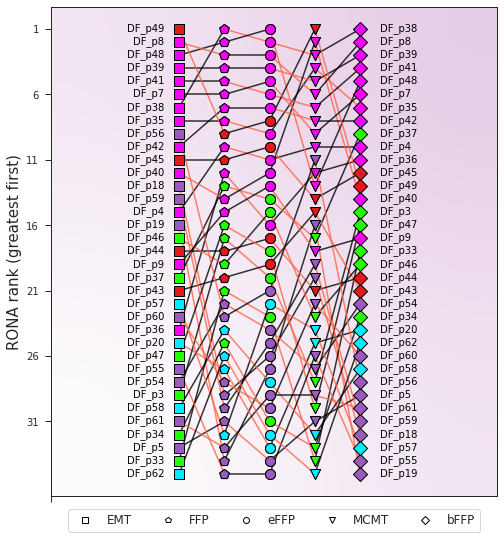

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_NA_ENSEMBLE_rcp45_2080s_sig_envs_slope_graph.pdf


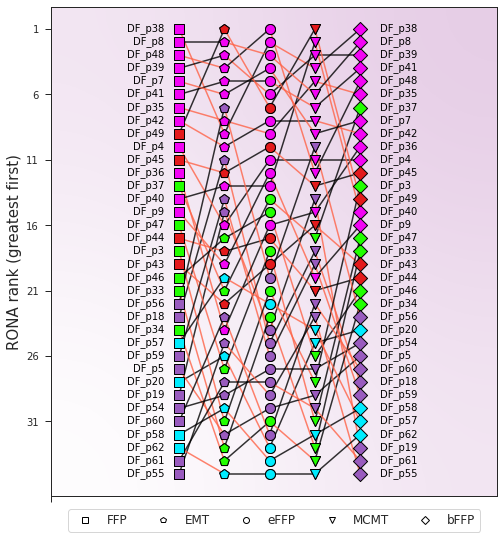

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_NA_ENSEMBLE_rcp85_2050s_sig_envs_slope_graph.pdf


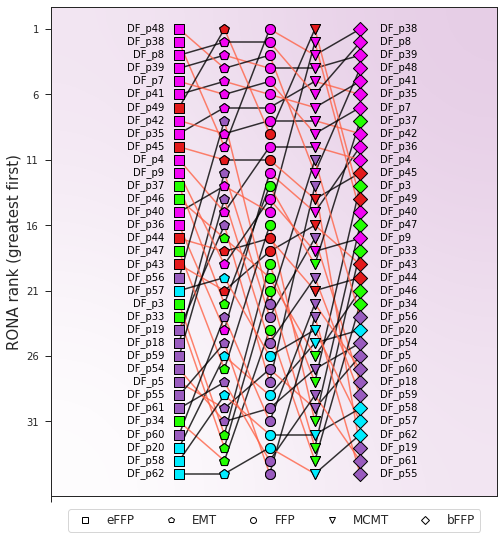

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_NA_ENSEMBLE_rcp85_2080s_sig_envs_slope_graph.pdf


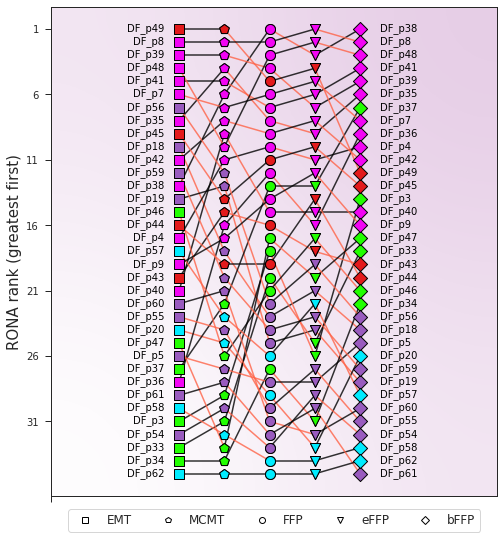

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_NA_ENSEMBLE_rcp45_2050s_sig_envs_slope_graph.pdf


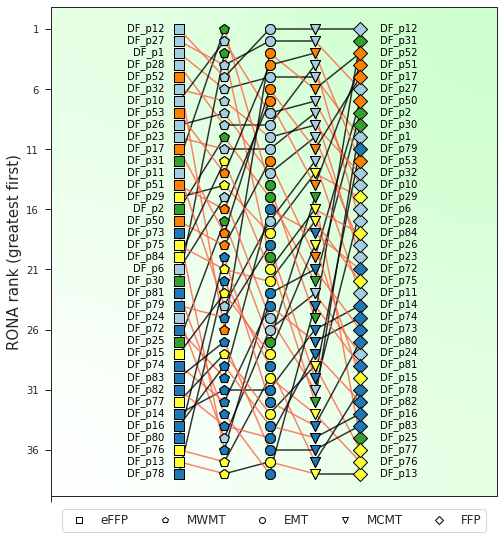

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_NA_ENSEMBLE_rcp45_2080s_sig_envs_slope_graph.pdf


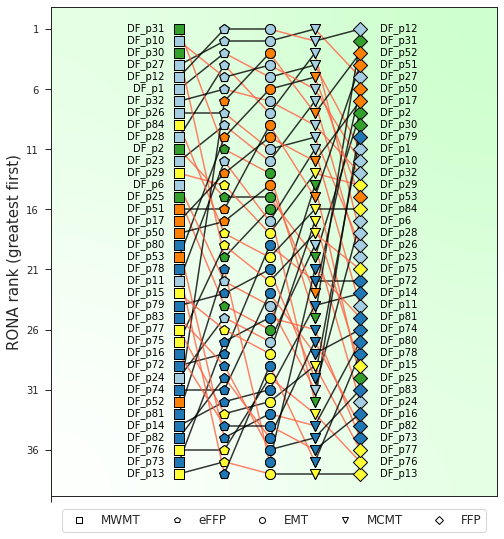

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_NA_ENSEMBLE_rcp85_2050s_sig_envs_slope_graph.pdf


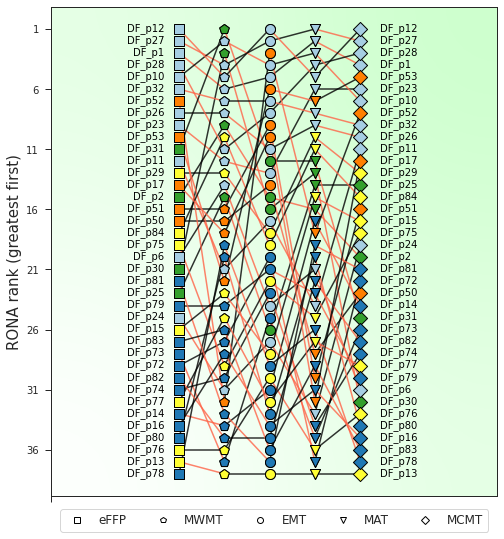

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_NA_ENSEMBLE_rcp85_2080s_sig_envs_slope_graph.pdf


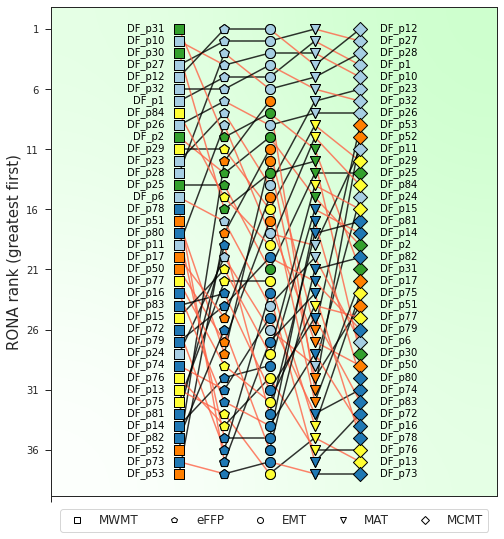

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_NA_ENSEMBLE_rcp45_2050s_sig_envs_slope_graph.pdf


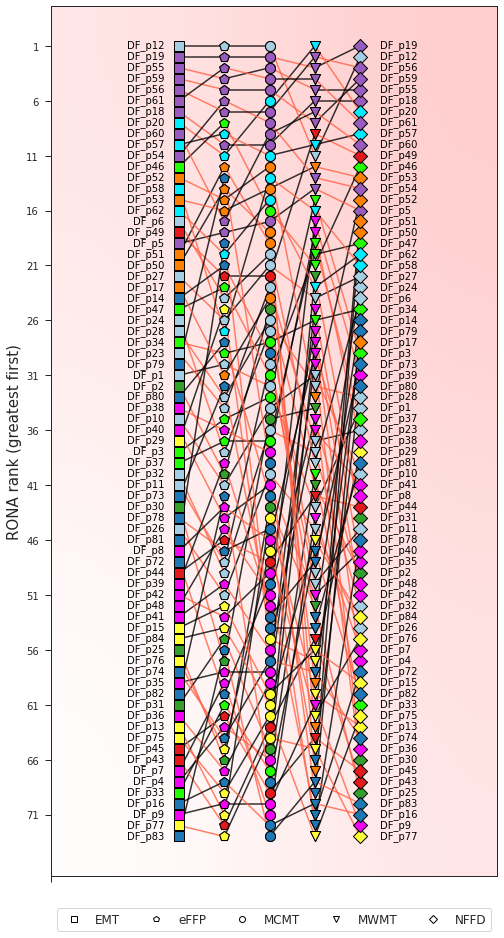

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_NA_ENSEMBLE_rcp45_2080s_sig_envs_slope_graph.pdf


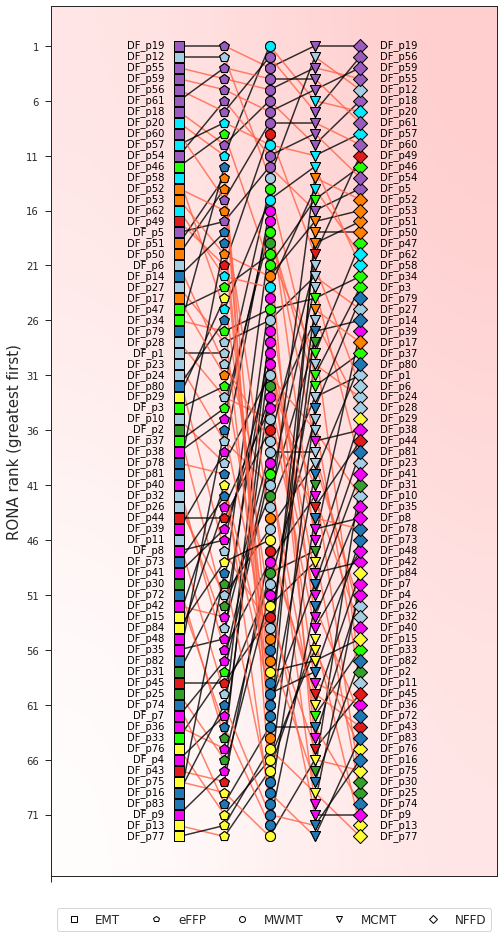

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_NA_ENSEMBLE_rcp85_2050s_sig_envs_slope_graph.pdf


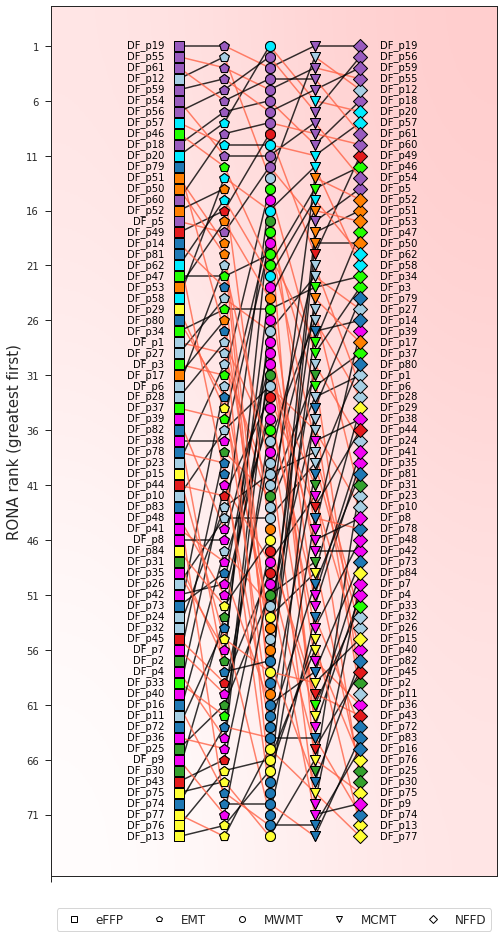

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_NA_ENSEMBLE_rcp85_2080s_sig_envs_slope_graph.pdf


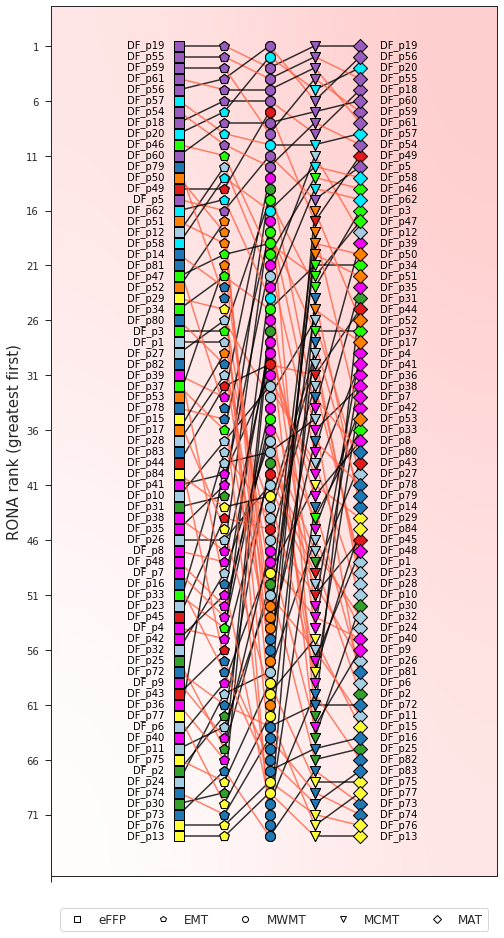

In [17]:
background_colors = {'jp': 'green',
                     'fdi': 'purple',
                     'fdc': 'lime',
                     'combined': 'red'}

figsize = defaultdict(lambda: (8, 9))
figsize['combined'] = (8, 16)

figdir = op.join(ronadir, 'figs')
assert op.exists(figdir)

for (spp, rcp), sig_envs in unwrap_dictionary(canonical_efs):
    # get RONA estimates for each of the significant environments
    slope_data = []
    for env in sig_envs:
        series = myrona[spp][env][rcp].copy()
        series.name = env
        slope_data.append(series)
    
    # create the slope graph
    fig, ax = plt.subplots(1, 1, figsize=figsize[spp])
    _cmap = create_cmap(['white', background_colors[spp]], grain=1000)
    ax = slope_graph(slope_data[0], *slope_data[1:], labels=sig_envs, shape_color=all_colors[spp.split('-')[0]],
                     markers=['s', 'p', 'o', 'v', 'D'], ascending=False, ax=ax,
                     ylabel='RONA rank (greatest first)', marker_size=100)
    gradient_image(ax, direction=0.5, transform=ax.transAxes, extent=(0,1,0,1),
                   cmap=_cmap, cmap_range=(0.0, 0.2))
    
    # save it
    saveloc = op.join(figdir, f'{spp}_{rcp}_sig_envs_slope_graph.pdf')
    save_pdf(saveloc)
    
    # show it
    plt.show()
    plt.close()   
    

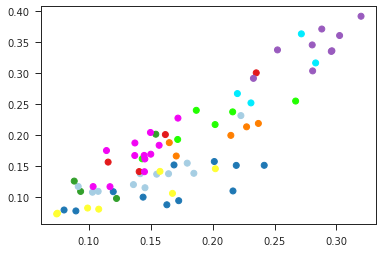

In [18]:
# sanity check that I'm ranking correctly - this scatter is between eFFP and EMT from final fig of last cell
plt.scatter(slope_data[0],
            slope_data[-1].loc[slope_data[0].index],
            c=slope_data[0].index.map(all_colors[spp.split('-')[0]]))
plt.show()

# subset offset data for genetic groups

In [19]:
# copied from output of cell [9] from 11_validate_GF_offset_predictions.ipynb
genetic_groups = {
    'eastern': ['DF_p3', 'DF_p5', 'DF_p18', 'DF_p19', 'DF_p20', 'DF_p33', 'DF_p34',
                'DF_p37', 'DF_p46', 'DF_p47', 'DF_p54', 'DF_p55', 'DF_p56', 'DF_p57',
                'DF_p58', 'DF_p59', 'DF_p60', 'DF_p61', 'DF_p62'],
    'western': ['DF_p4', 'DF_p7', 'DF_p8', 'DF_p9', 'DF_p35', 'DF_p36', 'DF_p38',
                'DF_p39', 'DF_p40', 'DF_p41', 'DF_p42', 'DF_p43', 'DF_p44', 'DF_p45',
                'DF_p48', 'DF_p49']
}

In [20]:
keys(future_clim)

['jp', 'fdi', 'fdc', 'combined']

In [21]:
# add the northwestern and southeastern genetic groups to dictionaries by subsetting data
# also add coastal-combined and interior-combined
group_data = wrap_defaultdict(None, 2)
for (spp, rcp), gf_offset in unwrap_dictionary(gf_offsets):
    if spp in ['fdi', 'combined']:
        for group in ['eastern', 'western']:  # group goes into the spp level of gf_offsets
            # add to gradient forest offsets
            group_data[f'{group}-{spp}'][rcp] = gf_offset.loc[genetic_groups[group]].copy()
            
            # add to env dicts
            canonical_efs[f'{group}-{spp}'][f'NA_ENSEMBLE_{rcp}'] = canonical_efs[spp][f'NA_ENSEMBLE_{rcp}']
            cbst_envs[f'{group}-{spp}'] = cbst_envs[spp]
            prov_envs[f'{group}-{spp}'] = prov_envs[spp]
            
            # add to future_clim
            future_clim[f'{group}-{spp}'][f'NA_ENSEMBLE_{rcp}'] = future_clim[spp][f'NA_ENSEMBLE_{rcp}'].loc[genetic_groups[group]].copy()
            
    # add coastal-combined and interior-combined
    if spp == 'combined':
        for group in ['fdc', 'fdi']:
            # add to gradient forest offsets
            group_data[f'{group}-{spp}'][rcp] = gf_offset.loc[envdata[group].index].copy()

            # add to env dicts
            canonical_efs[f'{group}-{spp}'][f'NA_ENSEMBLE_{rcp}'] = canonical_efs[spp][f'NA_ENSEMBLE_{rcp}']
            cbst_envs[f'{group}-{spp}'] = cbst_envs[spp]
            prov_envs[f'{group}-{spp}'] = prov_envs[spp]
            
            # add to future_clim
            future_clim[f'{group}-{spp}'][f'NA_ENSEMBLE_{rcp}'] = future_clim[spp][f'NA_ENSEMBLE_{rcp}'].loc[envdata[group].index]
            
gf_offsets.update(group_data)

In [22]:
gf_offsets.keys()

dict_keys(['combined', 'fdc', 'fdi', 'jp', 'eastern-combined', 'western-combined', 'fdc-combined', 'fdi-combined', 'eastern-fdi', 'western-fdi'])

In [23]:
# update rona
group_rona = wrap_defaultdict(None, 3)
for (spp, env), rona_offset in unwrap_dictionary(myrona):  # rona_offset is a df: pops for rows, rcp for columns
    if spp in ['fdi', 'combined']:
        for group in ['eastern', 'western']:
            group_rona[f'{group}-{spp}'][env] = rona_offset.loc[genetic_groups[group]].copy()
    if spp == 'combined':
        for group in ['fdc', 'fdi']:
            group_rona[f'{group}-{spp}'][env] = rona_offset.loc[envdata[group].index].copy()
            
myrona.update(group_rona)

In [24]:
keys(myrona)

['jp',
 'fdi',
 'fdc',
 'combined',
 'eastern-fdi',
 'western-fdi',
 'eastern-combined',
 'western-combined',
 'fdc-combined',
 'fdi-combined']

In [25]:
# update all colors
for group in ['eastern', 'western']:
    all_colors[group] = dict(envdata['fdi'].loc[genetic_groups[group], 'group_color'])


# show relationship between cross-variety and variety-specific RONA predictions

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc-combined_fdc_NA_ENSEMBLE_rcp45_2050s_rona_comparison.pdf


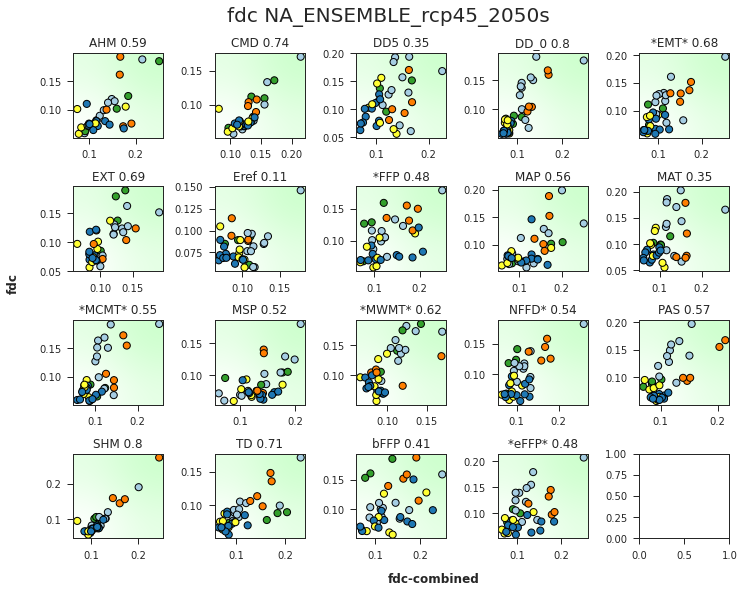

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi-combined_fdi_NA_ENSEMBLE_rcp45_2050s_rona_comparison.pdf


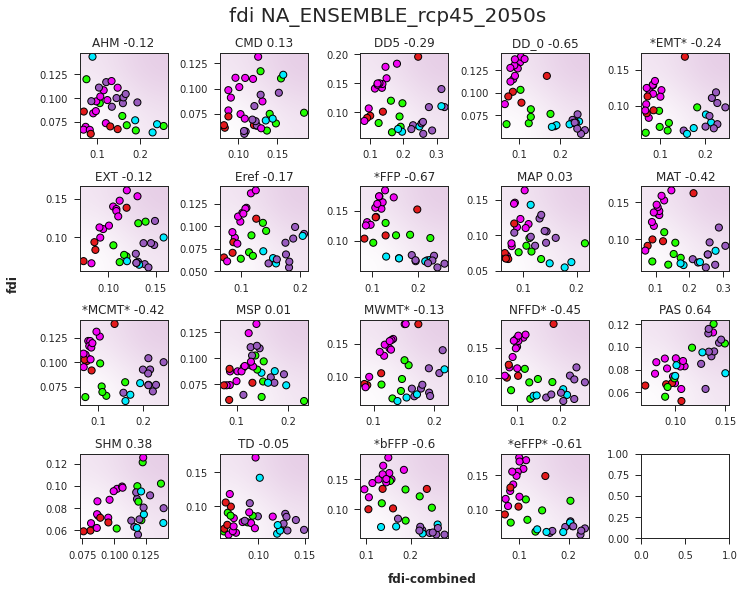

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-combined_western-fdi_NA_ENSEMBLE_rcp45_2050s_rona_comparison.pdf


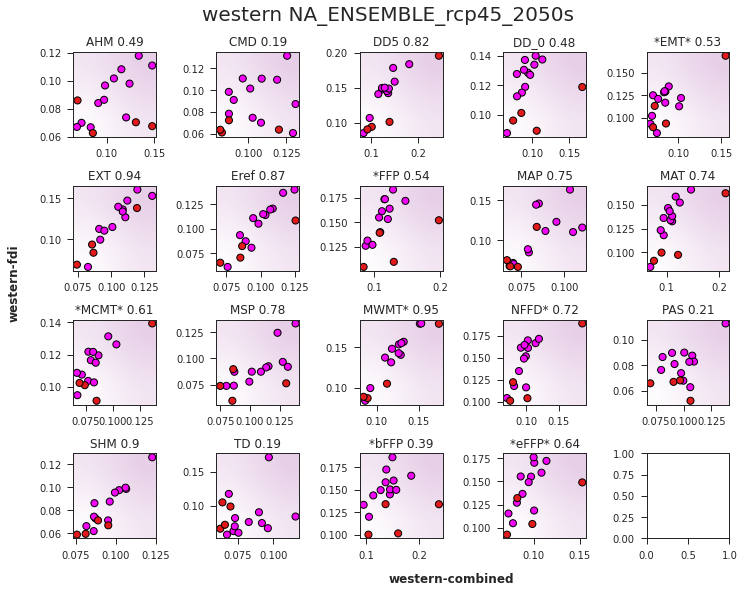

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-combined_eastern-fdi_NA_ENSEMBLE_rcp45_2050s_rona_comparison.pdf


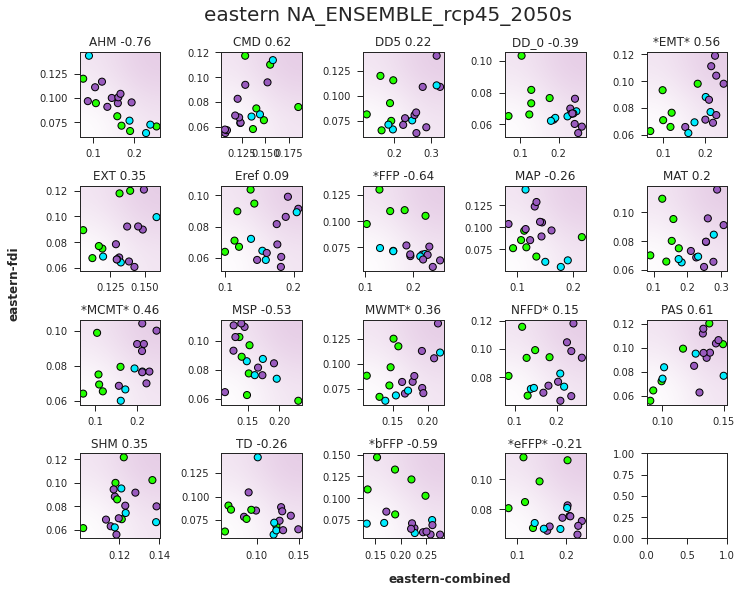

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc-combined_fdc_NA_ENSEMBLE_rcp45_2080s_rona_comparison.pdf


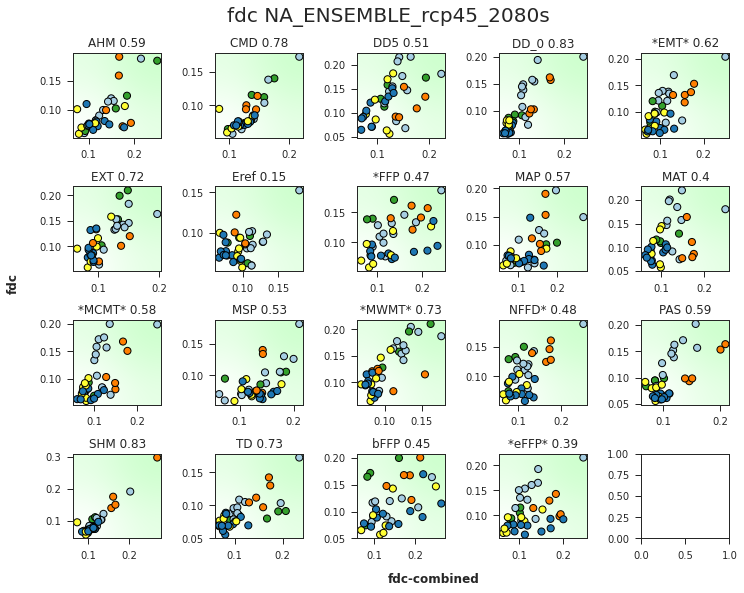

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi-combined_fdi_NA_ENSEMBLE_rcp45_2080s_rona_comparison.pdf


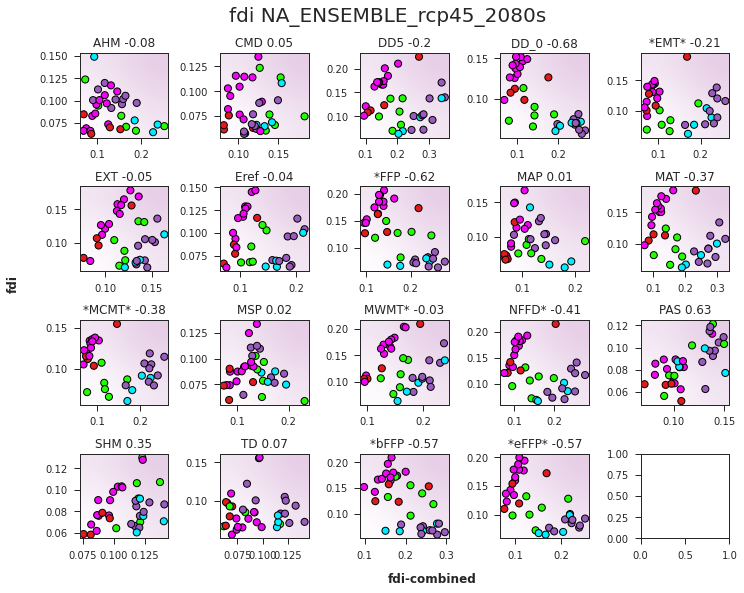

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-combined_western-fdi_NA_ENSEMBLE_rcp45_2080s_rona_comparison.pdf


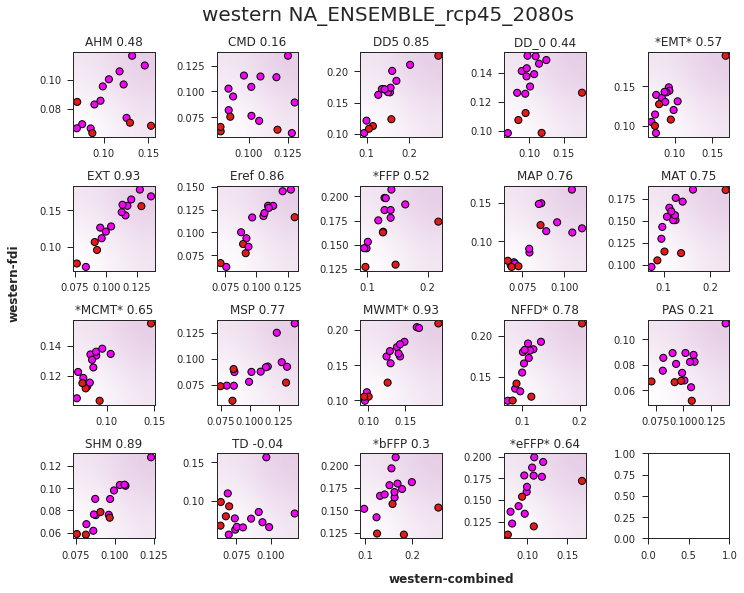

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-combined_eastern-fdi_NA_ENSEMBLE_rcp45_2080s_rona_comparison.pdf


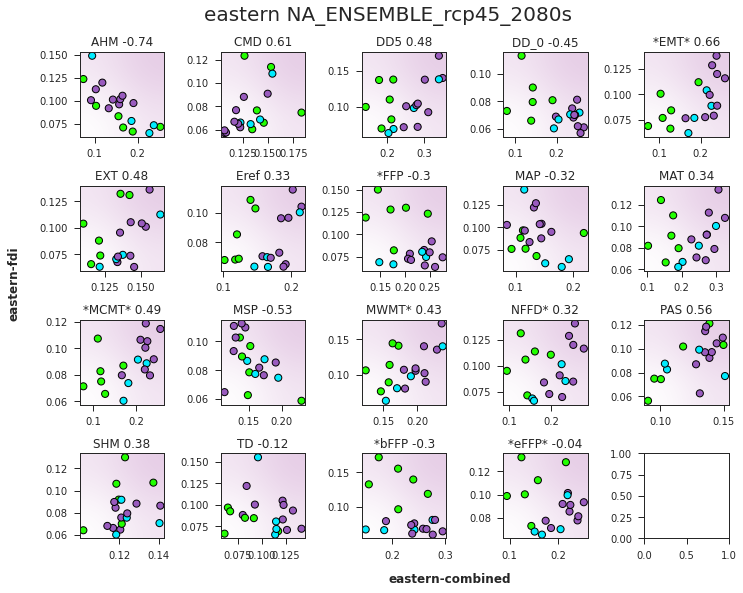

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc-combined_fdc_NA_ENSEMBLE_rcp85_2050s_rona_comparison.pdf


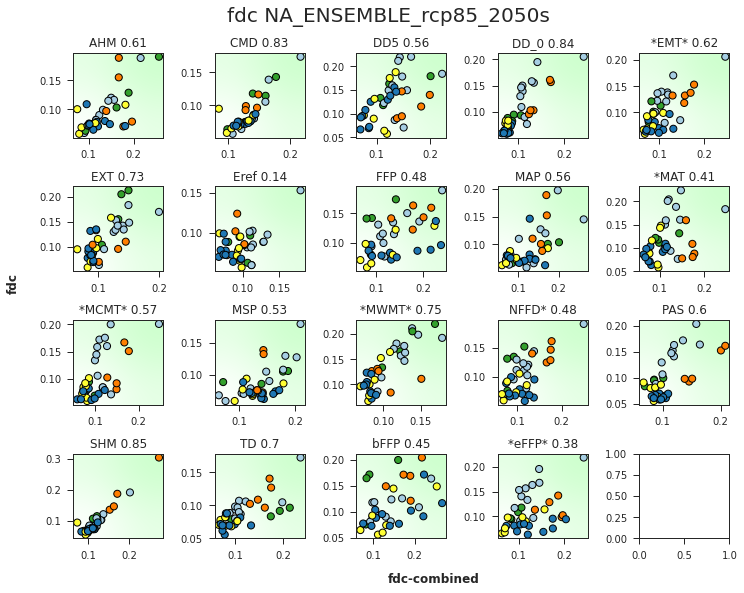

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi-combined_fdi_NA_ENSEMBLE_rcp85_2050s_rona_comparison.pdf


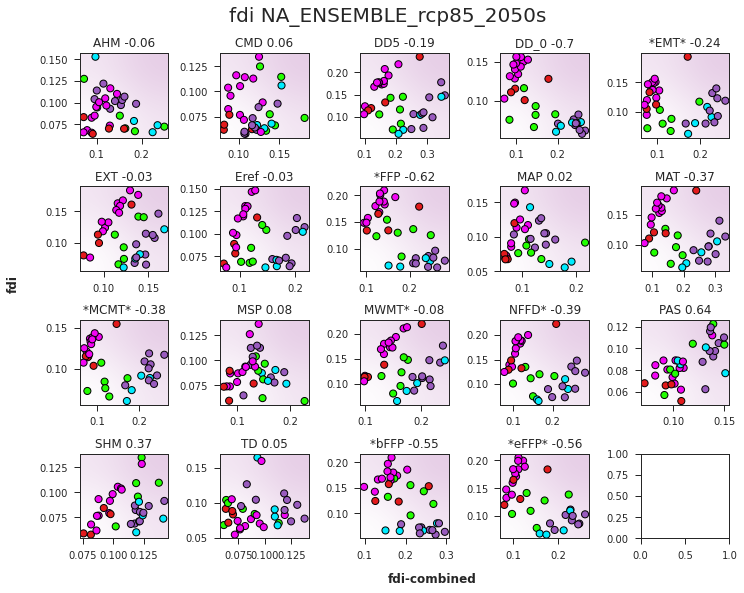

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-combined_western-fdi_NA_ENSEMBLE_rcp85_2050s_rona_comparison.pdf


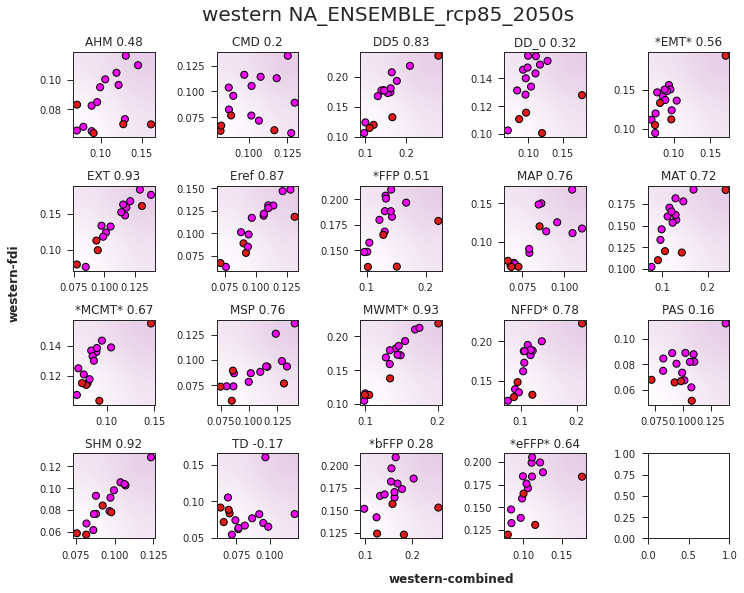

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-combined_eastern-fdi_NA_ENSEMBLE_rcp85_2050s_rona_comparison.pdf


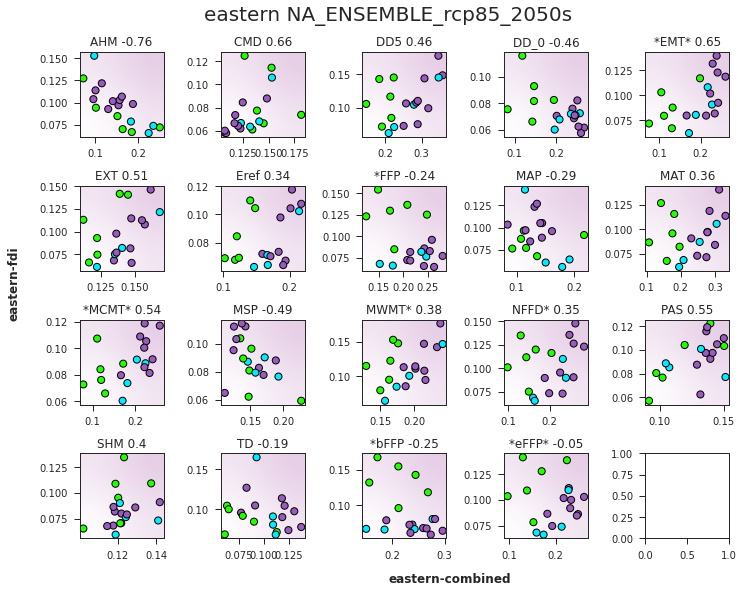

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc-combined_fdc_NA_ENSEMBLE_rcp85_2080s_rona_comparison.pdf


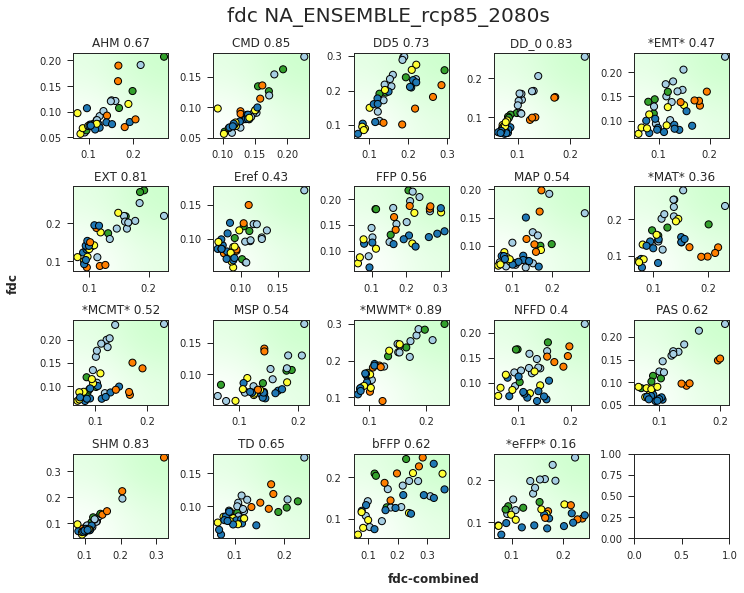

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi-combined_fdi_NA_ENSEMBLE_rcp85_2080s_rona_comparison.pdf


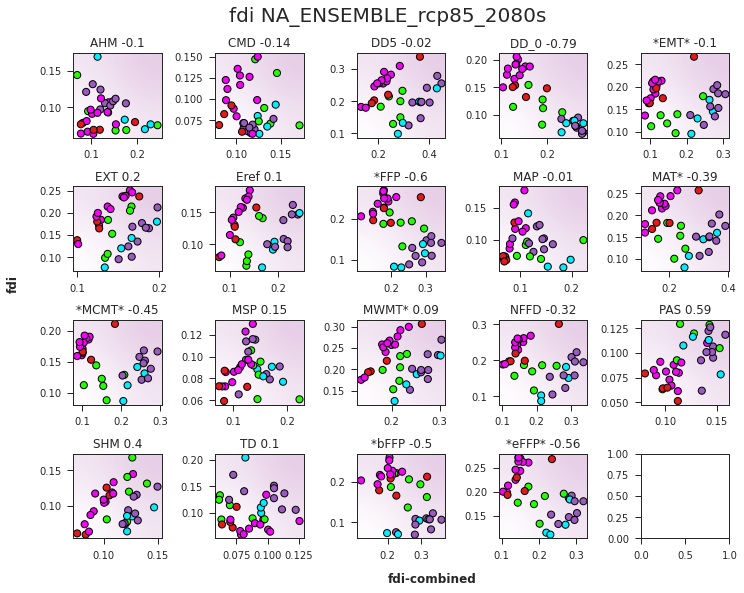

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-combined_western-fdi_NA_ENSEMBLE_rcp85_2080s_rona_comparison.pdf


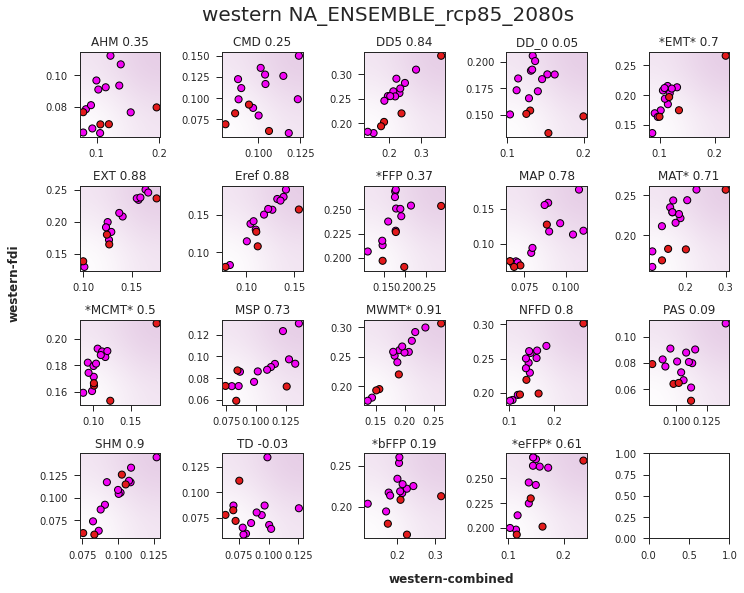

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-combined_eastern-fdi_NA_ENSEMBLE_rcp85_2080s_rona_comparison.pdf


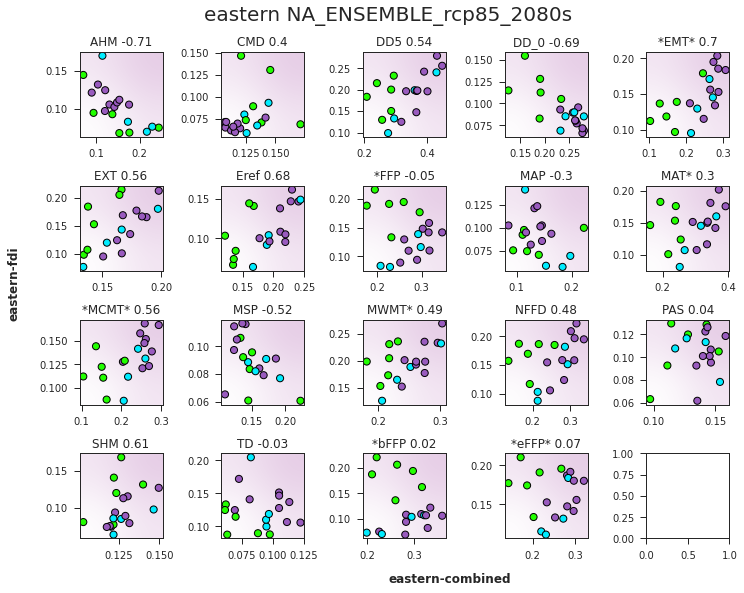

In [26]:
envs = sorted(keys(myrona['combined']))
for rcp in ['NA_ENSEMBLE_rcp45_2050s', 'NA_ENSEMBLE_rcp45_2080s',
            'NA_ENSEMBLE_rcp85_2050s', 'NA_ENSEMBLE_rcp85_2080s']:
    for spp in ['fdc', 'fdi', 'western', 'eastern']:
        fig, axes = plt.subplots(4, 5, figsize = (10, 8))
        
        for ax, env in zip(axes.flat, envs):
            if spp in ['fdc', 'fdi']:
                var_model = myrona[spp][env][rcp].copy()
                ylabel = spp
            else:
                var_model = myrona[f'{spp}-fdi'][env][rcp].copy()
                ylabel = f'{spp}-fdi'
                
            var_combined = myrona[f'{spp}-combined'][env][rcp].loc[var_model.index].copy()
            xlabel = f'{spp}-combined'
            
            colors = [all_colors['combined'][samp] for samp in var_combined.index]
            
            ax.scatter(var_combined, var_model, c=colors, edgecolor='k', s=50)
            
            ccolor = 'purple' if spp in ['eastern', 'western', 'fdi'] else 'lime'
            _cmap = create_cmap(['white', ccolor], grain=1000)
            gradient_image(ax, direction=0.5, transform=ax.transAxes, extent=(0,1,0,1),
                           cmap=_cmap, cmap_range=(0.0, 0.2))
            
            rho = round(
                var_model.corr(var_combined, method='spearman'),
                2
            )
            
            # add to env name so that I know if env was sig diff between current and future
            xenvs = canonical_efs[xlabel][rcp]
            yenvs = canonical_efs[ylabel][rcp]
            
            _env = env
            if _env in yenvs:
                env = f'*{env}'
            if _env in xenvs:
                env = f'{env}*'
            
            ax.set_title(f'{env} {rho}')
        
        fig.text(0.5, -0.02, xlabel, 
                 fontdict=dict(weight='bold', fontsize=12))
        fig.text(-0.02, 0.5, ylabel, rotation='vertical', ha='center', va='center',
                 fontdict=dict(weight='bold', fontsize=12))
        
        fig.suptitle(f'{spp} {rcp}', fontsize=20)
        plt.tight_layout()
        
        file = op.join(figdir, f'{xlabel}_{ylabel}_{rcp}_rona_comparison.pdf')
        save_pdf(file)
        
        plt.show()
        plt.close()

<a id='bubble'></a>
# 4. create bubble plots to show difference in rank between RONA and GF

[top](#home)

In [27]:
# meta data for fig
extent = {'jp': [-119.5, -58, 41, 60],
          'combined': [-130, -112.5, 37.5, 55.5],
          'fdc': [-130, -112.5, 37.5, 55.5],
          'fdi': [-130, -112.5, 37.5, 55.5]}

figsize = {'jp': (15, 10),
           'combined': (8, 15),
           'fdc': (8, 15),
           'fdi': (8, 15)}

model = {
    'fdc' : 'coastal variety model',
    'fdi' : 'interior variety model',
    'combined' : 'cross-variety model',
    'jp' : 'jack pine model'
}

coastrange = '/data/projects/pool_seq/environemental_data/shapefiles/Coastal_DF.shp'
intrange = '/data/projects/pool_seq/environemental_data/shapefiles/Interior_DF.shp'

df_shapefiles = list(zip(['lime', 'purple'], [coastrange, intrange]))

jp_shapefiles = shapefiles=[('green', '/data/projects/pool_seq/environemental_data/shapefiles/jackpine.shp')]

shapefile_dict = {
    'fdc' : [df_shapefiles[0]],
    'fdi' : [df_shapefiles[1]],
    'combined' : df_shapefiles,
    'jp' : jp_shapefiles
}

In [28]:
def get_ranks(offset_data):
    """Rank offset so that lowest offset is ranked first.
    
    This way, rank/n_ranks will have small bubbles for low offset
    """
    # rank each population within each offset source (ie rona env or gf) - df with pops for cols and rows for offset source
    ranks = pd.DataFrame(offset_data).apply(lambda x: x.rank(ascending=True), axis=1)
    # get median rank for each population across offset sources, sort pops by rank
    median_ranks = ranks.apply(np.median, axis=0).sort_values(ascending=True)
    # order columns by median rank
    ranks = ranks[median_ranks.index.tolist()]
    
    return ranks

def bubble_plot(spp, rcp, gf_offset, pops=None, plot_same=False):
    # get GF data
    gf_offset_vals = gf_offset[gf_offset.columns[-1]].copy()
    gf_offset_vals.name = 'GF'

    # get RONA estimates for each of the environments in `sig_envs`
    rona_data = []
    for env in canonical_efs[spp][f'NA_ENSEMBLE_{rcp}']:
        series = myrona[spp][env][f'NA_ENSEMBLE_{rcp}'].copy()
        series.name = env
        rona_data.append(series)

    # combine into a dataframe    
    rona_df = pd.DataFrame(rona_data)

    # find median rank across RONA envs
    rona_rank = get_ranks(rona_df).apply(np.median, axis=0)

    # add RONA and GF into one dataframe (rank GF along the way) (rows = method, cols = pops, vals = method_rank)
        # ascending is True so that low offset ranks get small bubbles
    ranks = pd.DataFrame({'RONA' : rona_rank, 'GF' : gf_offset_vals.rank(ascending=True)}).T

    # get ranks and sizes
    sizes = ranks.apply(lambda row: 100 + (500 * row / ncol(ranks)), axis=0)

    if plot_same is True:
        # create overlapping figure with GF rank on top of circles
        ax = basemap(extent=extent[spp], figsize=figsize[spp], shapefiles=shapefile_dict[spp])
        for pop in sizes.columns:
            gf_size, rona_size = sizes.loc[['GF', 'RONA'], pop]
    #         print(gf_size > rona_size)
            if rona_size > gf_size:
                rona_zorder = 10
                gf_zorder = 11
                text_color = 'k'
            else:
                rona_zorder = 11
                gf_zorder = 10
                text_color = 'white'

            color, lat, long = envdata[spp][['group_color', 'LAT', 'LONG']].loc[pop]

            # plot GF
            draw_pie_marker([1,0], long, lat, gf_size, colors=['white'], ax=ax, transform=True, edgecolors=None,
                            zorder=gf_zorder)

            # plot rona
            draw_pie_marker([1,0], long, lat, rona_size, colors=['k'], ax=ax, transform=True, edgecolors=None,
                            zorder=rona_zorder)

            # put rank in
            text = abs(ncol(sizes) - ranks.loc['GF', pop].astype(int)) + 1
            plt.text(long, lat, text, c=text_color, ha='center', va='center',
                     transform=ccrs.PlateCarree(), zorder=12)
        f = f'{figdir}/{spp}_{rcp}_GF-RONA_bubble_plot.pdf'
        plt.show()

    else:
        # create two figs
        for method in ['GF', 'RONA']:
            ax = basemap(extent=extent[spp], figsize=figsize[spp], shapefiles=shapefile_dict[spp])

            texts = []
            for pop in sizes.columns:
                pop_size = sizes.loc[method, pop]
                color, lat, long = envdata[spp][['group_color', 'LAT', 'LONG']].loc[pop]

                if method == 'GF':
                    text_color = 'k'
                    # plot GF
                    draw_pie_marker([1,0], long, lat, pop_size, colors=['white'], ax=ax, transform=True,
                                    edgecolors=color)
                else:
                    text_color = 'white'
                    # plot rona
                    draw_pie_marker([1,0], long, lat, pop_size, colors=['k'], ax=ax, transform=True,
                                    edgecolors=color)

                # put rank in
                text = abs(ncol(sizes) - ranks.loc[method, pop].astype(int)) + 1
                ax.text(long, lat, text, c=text_color, ha='center', va='center',
                        transform=ccrs.PlateCarree(), zorder=12)
            f = f'{figdir}/{spp}_{rcp}_{method}_bubble_plot.pdf'
            save_pdf(f)
            plt.show()

    return ranks

In [29]:
def draw_xy(ax, lims=None, alpha=1, zorder=5, linewidth=0.5, color='k', linestyle='-', equal_aspect=False):
    """Draw x=y line on a matplotlib ax."""
    if lims is None:
        lims = [
            np.min([ax.get_xlim(), ax.get_ylim()]),  # min of both axes
            np.max([ax.get_xlim(), ax.get_ylim()]),  # max of both axes
        ]
    ax.plot(lims, lims, color, alpha=alpha, zorder=zorder, linewidth=linewidth, linestyle=linestyle)
    ax.set_xlim(lims)
    ax.set_ylim(lims)

    if equal_aspect is True:
        ax.set_aspect('equal')
#     g.ax_marg_x.set_xlim(lims)
#     g.ax_marg_y.set_ylim(lims)

    pass

combined
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_rcp85_2050s_GF_bubble_plot.pdf


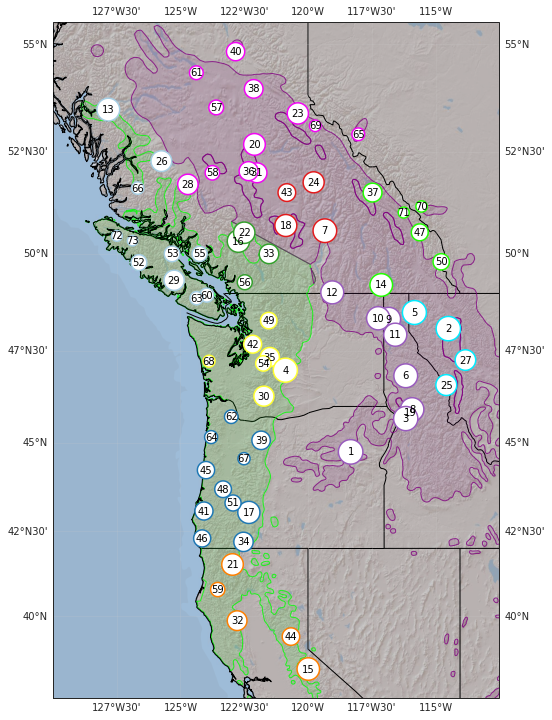

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_rcp85_2050s_RONA_bubble_plot.pdf


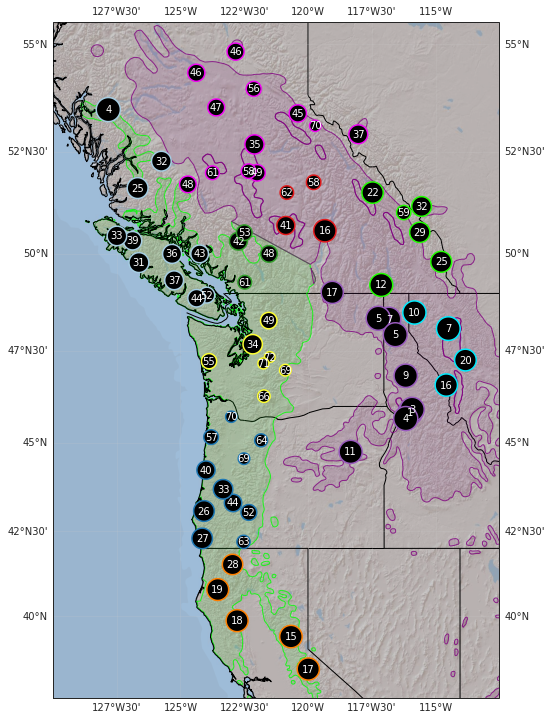

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_rcp85_2050s_GF-RONA_scatter_plot.pdf


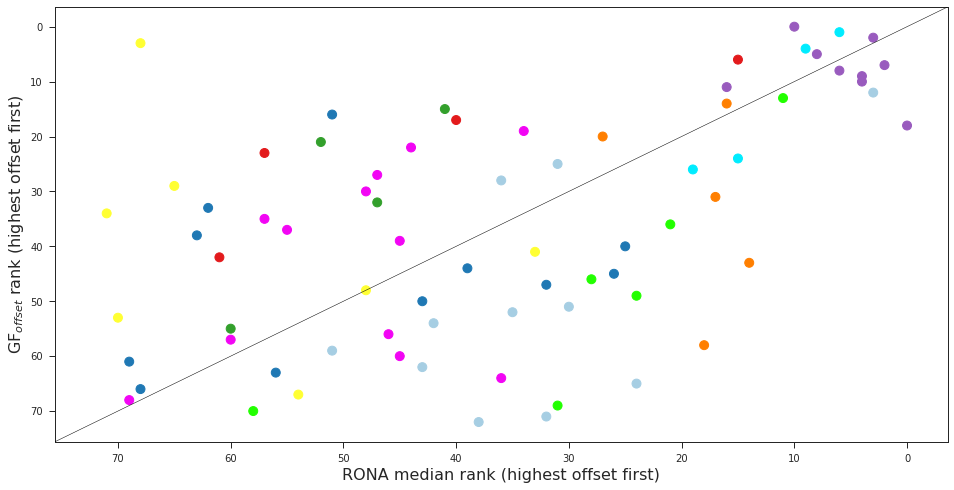

fdc
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_rcp85_2050s_GF_bubble_plot.pdf


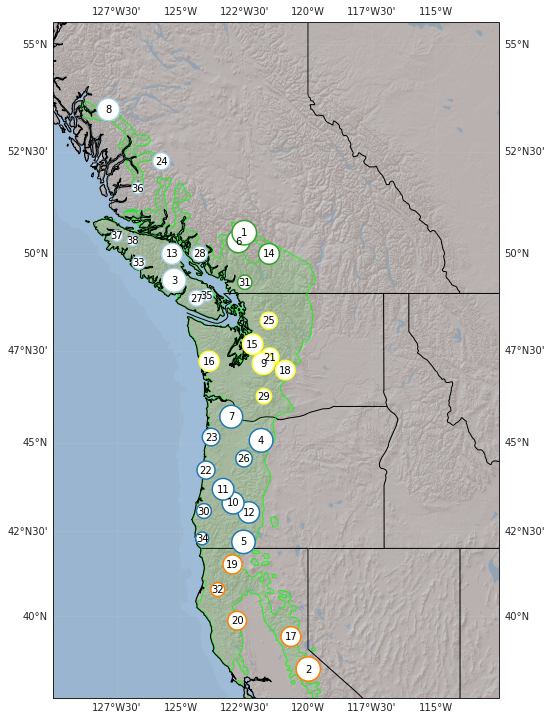

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_rcp85_2050s_RONA_bubble_plot.pdf


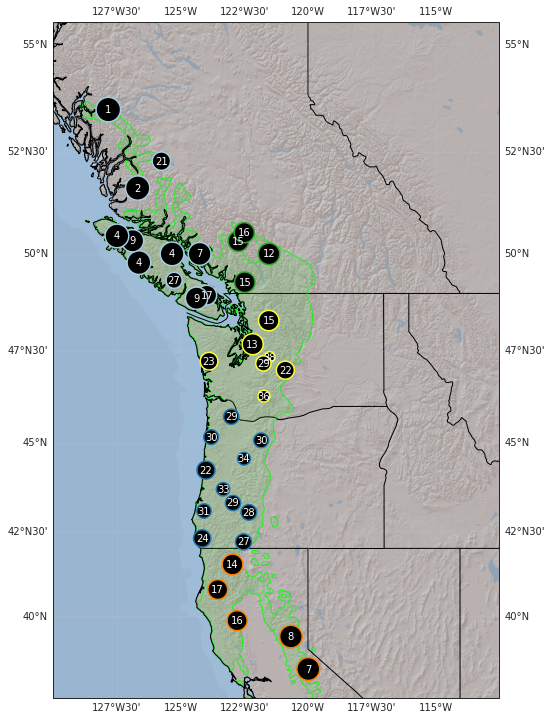

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_rcp85_2050s_GF-RONA_scatter_plot.pdf


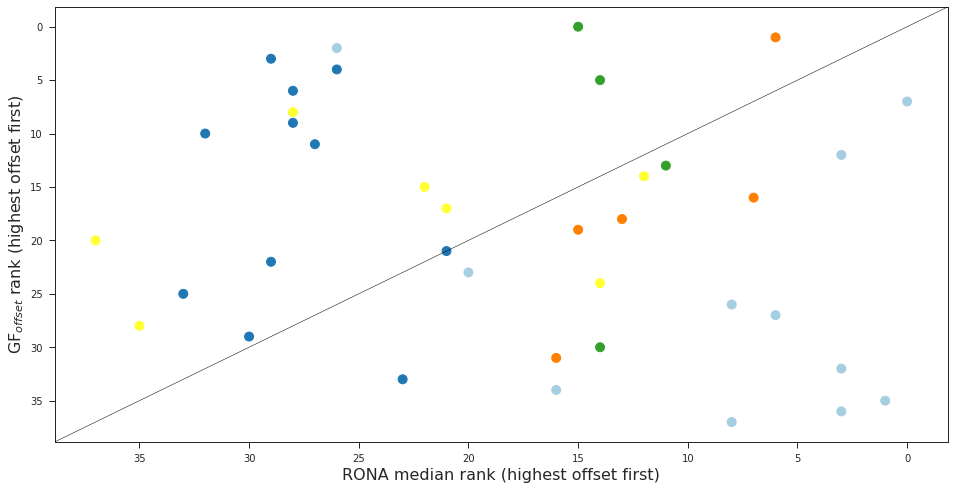

fdi
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_rcp85_2050s_GF_bubble_plot.pdf


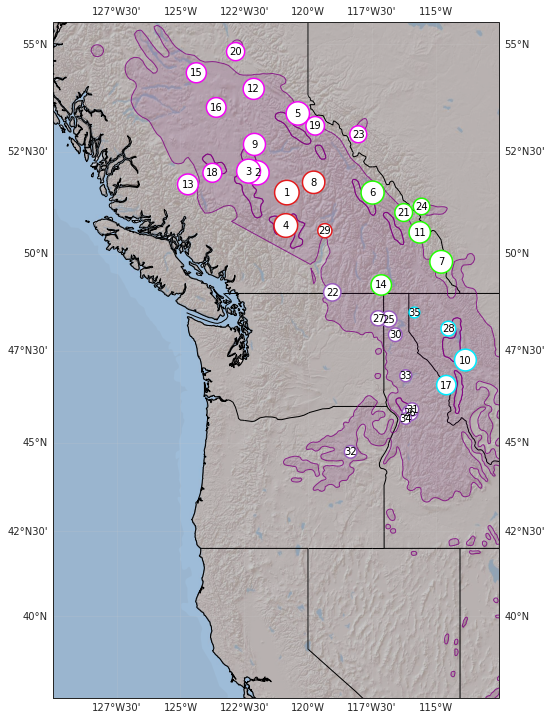

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_rcp85_2050s_RONA_bubble_plot.pdf


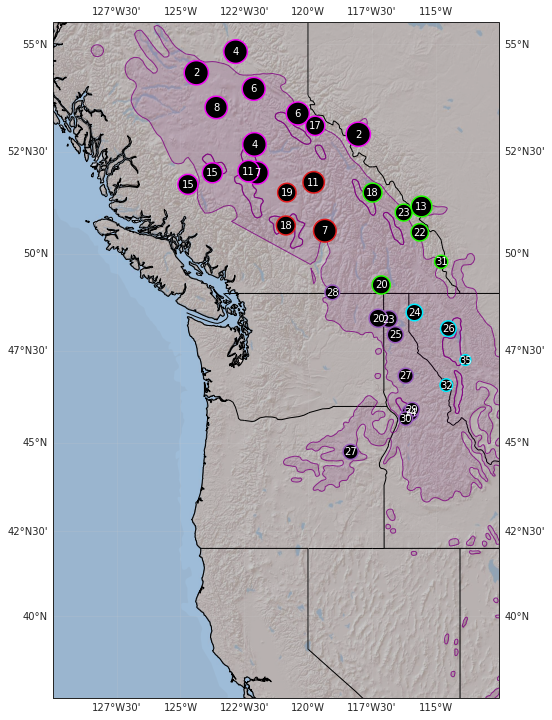

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_rcp85_2050s_GF-RONA_scatter_plot.pdf


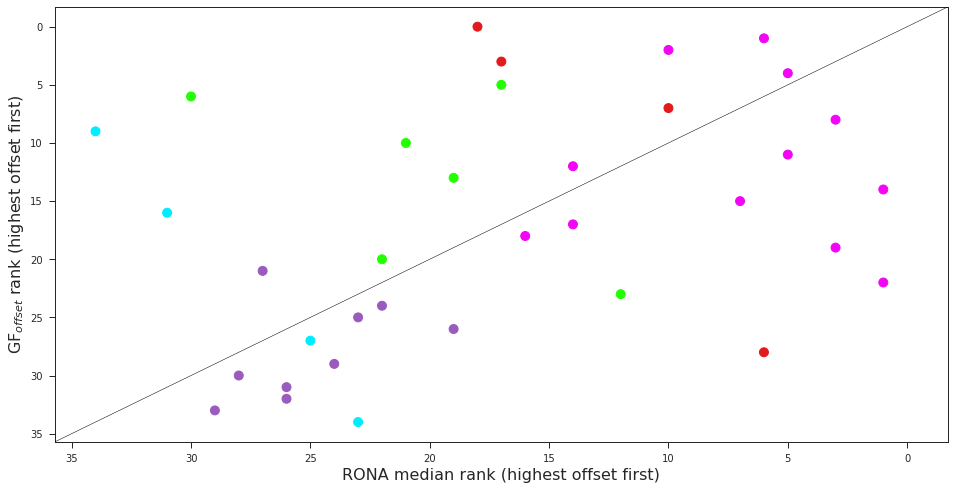

jp
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_rcp85_2050s_GF_bubble_plot.pdf


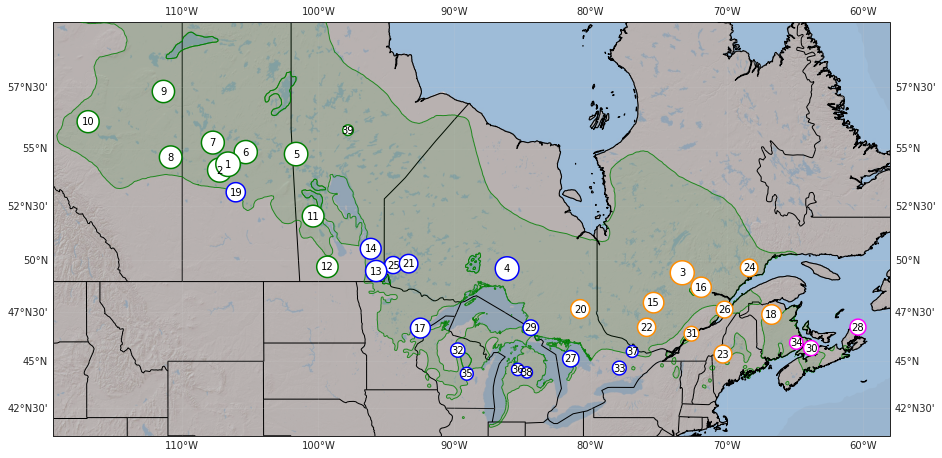

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_rcp85_2050s_RONA_bubble_plot.pdf


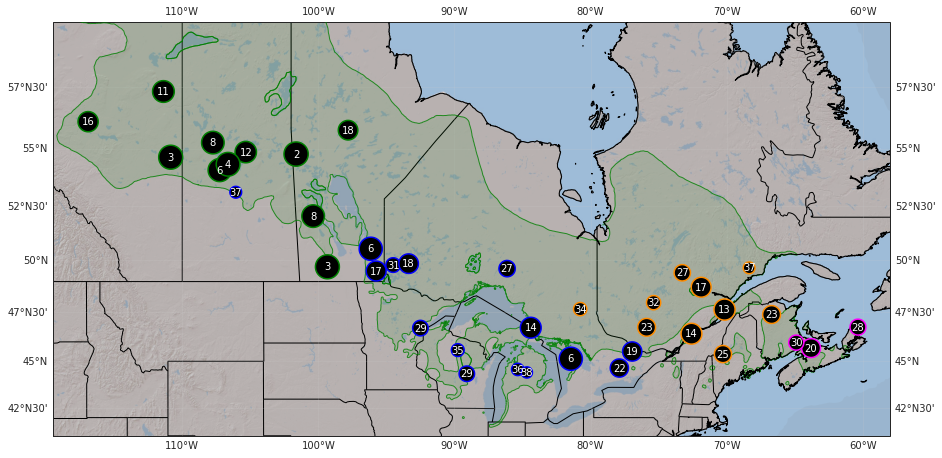

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_rcp85_2050s_GF-RONA_scatter_plot.pdf


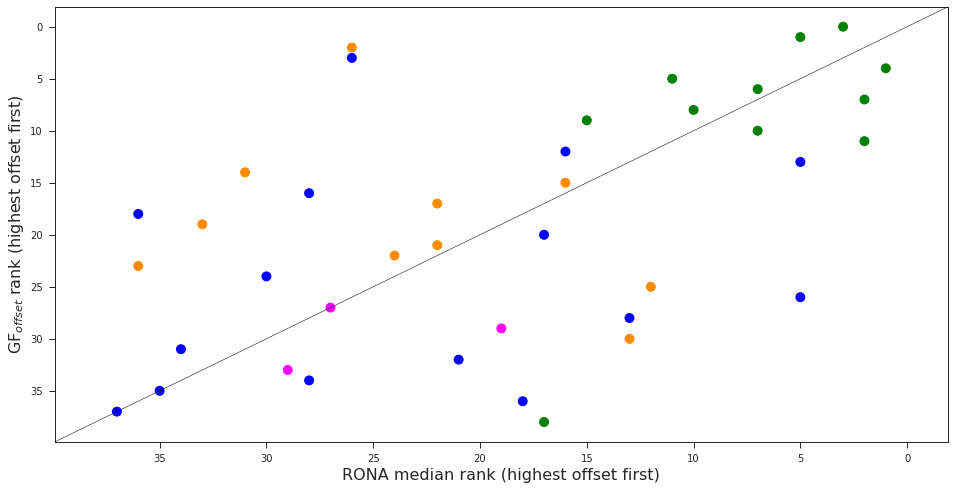

In [30]:
for (spp, rcp), gf_offset in unwrap_dictionary(gf_offsets):
    if '-' in spp:
        continue
    
    if rcp != 'rcp85_2050s':
        continue
        
    print(spp)
    ranks = bubble_plot(spp, rcp, gf_offset)
    
    scatter_ranks = abs(ranks - ncol(ranks))  # so that rank # match bubbles
    
    # draw scatter
    ax = plt.scatter(scatter_ranks.loc['RONA'],
                     scatter_ranks.loc['GF'],
                     s=80,
                     c=ranks.columns.map(all_colors[spp]))

    ax.figure.set_size_inches(16, 8)

    ax.axes.set_xlabel('RONA median rank (highest offset first)', fontsize=16)
    ax.axes.set_ylabel('GF$_{offset}$ rank (highest offset first)', fontsize=16)

    draw_xy(ax.axes)

    ax.axes.invert_xaxis()
    ax.axes.invert_yaxis()
    
    save_pdf(f'{figdir}/{spp}_{rcp}_GF-RONA_scatter_plot.pdf')
    
    plt.show()

In [31]:
# create correlation heatmaps and circos figs that combine rona and gf
for (spp, rcp), gf_offset in unwrap_dictionary(gf_offsets):
    if spp != 'combined':
        continue
    if rcp != 'rcp85_2050s':
        continue
    
    # get GF data
    gf_offset_vals = gf_offset[gf_offset.columns[-1]].copy()
    gf_offset_vals.name = 'GF'

    # a list of envs to iterate
    sig_env_dict = {
        'canonical': canonical_efs[spp][f'NA_ENSEMBLE_{rcp}'],
        'cbst': cbst_envs[spp],
        'prov': prov_envs[spp]
    }

    for source, sig_envs in sig_env_dict.items():
#         if source != 'canonical':      # CHANGE!!!!!!!!!!!!!!!!!
#             continue
            
        # get RONA estimates for each of the environments in `sig_envs`
        offset_data = []
        for env in sig_envs:
            series = myrona[spp][env][f'NA_ENSEMBLE_{rcp}'].copy()
            series.name = env
            offset_data.append(series)

        # add GF data
        offset_data.append(gf_offset_vals)
        break
    break
    
pd.DataFrame(offset_data)

,DF_p1,DF_p18,DF_p19,DF_p2,DF_p20,DF_p23,DF_p24,DF_p25,DF_p26,DF_p27,DF_p28,DF_p10,DF_p29,DF_p3,DF_p30,DF_p31,DF_p32,DF_p33,DF_p34,DF_p35,DF_p36,DF_p37,DF_p11,DF_p38,DF_p39,DF_p4,DF_p40,DF_p41,DF_p42,DF_p43,DF_p44,DF_p45,DF_p46,DF_p12,DF_p47,DF_p48,DF_p49,DF_p5,DF_p50,DF_p51,DF_p52,DF_p53,DF_p54,DF_p55,DF_p13,DF_p56,DF_p57,DF_p58,DF_p59,DF_p6,DF_p60,DF_p61,DF_p62,DF_p7,DF_p72,DF_p14,DF_p73,DF_p74,DF_p75,DF_p76,DF_p77,DF_p78,DF_p79,DF_p8,DF_p80,DF_p81,DF_p15,DF_p82,DF_p83,DF_p84,DF_p9,DF_p16,DF_p17
eFFP,0.145792,0.217402,0.261158,0.098801,0.213050,0.119315,0.103324,0.083942,0.105954,0.145145,0.130257,0.115386,0.157112,0.138679,0.081488,0.106157,0.100951,0.097047,0.152481,0.106027,0.084412,0.129808,0.091074,0.121921,0.125693,0.098352,0.096583,0.111273,0.104115,0.079675,0.115500,0.100247,0.224412,0.243655,0.170230,0.111500,0.176752,0.182390,0.194930,0.197388,0.187316,0.167908,0.231439,0.248185,0.063136,0.228413,0.227784,0.159128,0.233342,0.132305,0.192781,0.245729,0.174286,0.099472,0.090158,0.175538,0.103835,0.072843,0.075845,0.069244,0.069779,0.120216,0.204368,0.110790,0.154530,0.175267,0.115771,0.122640,0.111782,0.108257,0.083907,0.096460,0.135900
EMT,0.118569,0.229279,0.259962,0.103281,0.227587,0.115846,0.112343,0.076746,0.095717,0.131459,0.119945,0.105079,0.109016,0.112363,0.087197,0.082737,0.096334,0.076317,0.131218,0.085353,0.074857,0.105752,0.091556,0.104293,0.095713,0.075370,0.097431,0.091143,0.088703,0.074671,0.096904,0.081469,0.198819,0.247580,0.133052,0.087678,0.171329,0.166656,0.155982,0.157482,0.177918,0.170228,0.213449,0.242277,0.068121,0.238753,0.217286,0.188702,0.241168,0.147000,0.223259,0.234226,0.172323,0.077595,0.087168,0.131684,0.090183,0.075820,0.072820,0.073261,0.065241,0.099584,0.123281,0.093629,0.109127,0.099480,0.086387,0.082191,0.070128,0.087280,0.069792,0.071986,0.129962
MWMT,0.117763,0.214558,0.233727,0.122797,0.242025,0.123617,0.092430,0.098533,0.114242,0.146754,0.129303,0.138690,0.096910,0.176430,0.139085,0.169275,0.128142,0.129462,0.150250,0.155100,0.144637,0.169043,0.097677,0.168786,0.174886,0.149009,0.100169,0.133879,0.146289,0.105519,0.134341,0.099413,0.163274,0.178778,0.165062,0.134101,0.201005,0.184639,0.084764,0.092175,0.109991,0.151017,0.187560,0.215089,0.080097,0.238672,0.192929,0.174203,0.201992,0.128422,0.201795,0.216743,0.157193,0.128549,0.074635,0.086010,0.084545,0.082754,0.069553,0.081251,0.081820,0.077997,0.078212,0.142283,0.084133,0.083885,0.088533,0.090491,0.077429,0.109150,0.098585,0.074068,0.093767
MCMT,0.109917,0.212362,0.258857,0.117554,0.224954,0.127345,0.117719,0.086092,0.099719,0.135756,0.122501,0.104920,0.085995,0.118273,0.099066,0.073103,0.103035,0.077755,0.129347,0.083880,0.080052,0.110507,0.105766,0.104661,0.089886,0.076097,0.095118,0.085317,0.086703,0.078579,0.092387,0.074225,0.172217,0.246081,0.119978,0.082122,0.146523,0.166860,0.149059,0.149320,0.177203,0.166948,0.222480,0.241724,0.081810,0.223059,0.204559,0.182094,0.226631,0.136522,0.221984,0.234647,0.170738,0.070380,0.083585,0.122084,0.079596,0.075387,0.073480,0.080259,0.070534,0.091648,0.107983,0.089256,0.099130,0.085576,0.078925,0.072844,0.059234,0.077582,0.068810,0.067750,0.127950
NFFD,0.125257,0.248035,0.283165,0.092897,0.239515,0.115560,0.120468,0.078514,0.098925,0.138061,0.122417,0.114180,0.121845,0.144114,0.078131,0.116471,0.099042,0.099063,0.150235,0.117490,0.089873,0.130603,0.092482,0.121300,0.137596,0.104349,0.096624,0.118015,0.106279,0.087747,0.120751,0.094327,0.204757,0.249306,0.166779,0.106662,0.209443,0.188532,0.166445,0.175434,0.177513,0.174897,0.199127,0.257858,0.070130,0.262185,0.232186,0.160432,0.258161,0.123041,0.225570,0.231485,0.164394,0.105485,0.086822,0.137707,0.105835,0.075776,0.077918,0.079373,0.066398,0.111412,0.138860,0.112476,0.127510,0.117428,0.098114,0.095654,0.083837,0.105519,0.076922,0.082009,0.133929
GF,0.014509,0.046658,0.037931,0.038937,0.056450,0.010515,0.025071,0.013833,0.012873,0.012272,0.010885,0.014214,0.016730,0.015672,0.031713,0.022275,0.013966,0.011221,0.014823,0.022709,0.013


<a id='compare'></a>
# 5. compare rank correlation between RONA and GF offset estimates

- rank_boxplot (boxplot for each pop of ranks across offset sources, sorted by median rank)
- correlation heatmap among offset sources (ie RONA envs and GF)
- circos (all the good stuff)

[top](#home)

In [32]:
def rcp_heatmap(slope_data, rcp, saveloc=None, vmin=None, vmax=None, cbar=None, **cbar_kws):
    """Create heatmap for correlation among top envs and GF for a given RCP.
    
    Parameters
    ----------
    slope_data - list of pd.Series
        each series has population as row index and offset (RONA env or GF) as value
    rcp - str
        key for dictionaries
    saveloc - str
        where to save resulting figure
    vmin, vmax - int
        used to limit range of color bar
    cbar - bool
        wheter to use a colorbar legend
    cbar_kws - dict
        dictionary of keyword arguments passed to seaborn.heatmap
    
    Notes
    -----
    - don't add a colorbar since I'm going to combine with the GF correlation fig below.
    """
    # calculate correlation across RONA estimates
    corrs = defaultdict(dict)
    minn = 1
    maxx = -1
    for i, data_i in enumerate(slope_data):
        env_i = data_i.name
        for j, data_j in enumerate(slope_data):
            env_j = data_j.name
            if i < j:  # unique comparisons
                rho = data_i.corr(data_j, method='spearman')
                corrs[env_i][env_j] = rho
                corrs[env_j][env_i] = rho
                if rho < minn:
                    minn = rho
                if rho > maxx:
                    maxx = rho
            elif i == j:
                corrs[env_i][env_j] = 1

    # create correlation matrix
    df = pd.DataFrame(corrs)

    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(df, dtype=bool))

    # Draw the heatmap with the mask and correct aspect ratio
    cbar_kws.update({'label': r"Spearman's $\rho$"})
    ax = sns.heatmap(df, mask=mask, center=0, square=True, vmin=vmin, vmax=vmax, linewidths=.5, annot=True,
                     cbar=cbar, cmap='coolwarm', annot_kws=dict(weight='bold', fontsize=14, color='white'),
                     cbar_kws=cbar_kws
               )
    
    # set ticks (remove diagonal of correlation matrix)
    ylabels = ax.get_yticklabels()
    xlabels = ax.get_xticklabels()
    ax.set_yticks(ax.get_yticks()[1:])
    ax.set_xticks(ax.get_xticks()[:-1])
    ax.set_yticklabels(ylabels[1:], va='center', family='serif', fontsize=12)
    ax.set_xticklabels(xlabels[:-1], ha='center', family='serif', fontsize=12)
    
    # update color bar properties
    cbar_yaxis = ax.figure.axes[-1].yaxis
    cbar_yaxis.label.set_size(14)
    cbar_yaxis.set_ticks(cbar_yaxis.get_ticklocs())  # necessary to avoid warning
    cbar_yaxis.set_ticklabels(cbar_yaxis.get_ticklabels(),
                              fontsize=12)
    
    if saveloc is not None:
        save_pdf(saveloc)
    
    plt.show()

    return ax

In [33]:
class MyCircos(Gcircle):
    """My implementation of a circos plot, with much of the underlying code provided by pycircos."""
    
    def __init__(self):
        """Gcircle.__init__ with some add-ons."""
        # place to iterate for labels (raxis_range's) for MyCircos.add_labels
            # assumes no overlap/duplication among ranges per garc_id
        self.raxis_segments = defaultdict(list)
        
        super().__init__()
        
        pass
            
    def setspine(self, garc_id, label=None, rotate=False, text_kwargs={}, **kwargs):
        """Gcircle.setspine with some add-ons."""
        # append raxis_range for MyCircos.add_panel_labels
        self.raxis_segments[garc_id].append(kwargs['raxis_range'])
        
        if label is not None:
            # infer x position
            start, end = self._garc_dict[garc_id].coordinates
            xpos = start + ((end - start) / 2)
            
            # infer y position
            ymin, ymax = kwargs['raxis_range']
            ypos = ymin + ((ymax - ymin) / 2)
            
            # infer rotation of label - trig for the win! I had to draw a picture for each cartesian quadrant!
            if rotate is True:
                r = (start + end) / 2
                deg = np.rad2deg(r)
                if 0 <= deg <= 90:
                    rotation = (180 - deg - 90)
                elif 90 < deg <= 180:
                    rotation = -1 * (deg - 90)
                elif 180 < deg <= 270:
                    rotation = (270 - deg)
                else:
                    rotation = -1 * (180 - (360 - deg) - 90)
            else:
                rotation = None
            
            # set label
            self.ax.text(xpos, ypos, s=label, ha='center', va='center', rotation=rotation, **text_kwargs)
        
        return super().setspine(garc_id, **kwargs)
        
    def myscatter(self,
                  garc_id,
                  positions=None,  # x
                  data=None,  # y
                  raxis_range=None,
                  rlim=None,                  
                  spine=False,
                  markershape="o",
                  markersize=10,
                  facecolor=None,
                  edgecolor="#303030",
                  linewidth=0.0,
                  plot_linear_fit=True,
                  **spine_kwargs
                 ):
        """Create scatter plot in polar coordinates. Similar to Gcircle.scatter, but better."""
        # append raxis_range for MyCircos.add_panel_labels
        self.raxis_segments[garc_id].append(raxis_range)

        start, end = self._garc_dict[garc_id].coordinates
        data_diff = max(positions) - min(positions)
        
        # reset where positions will start and end
        axis_range = end - start
        start += (0.05 * axis_range)
        end -= (0.05 * axis_range)
        
        # set x-positions so they appear correctly in the scatter plot
        if positions is None:
            positions = np.linspace(start, end, len(positions), endpoint=True)
        else:
            new_positions = [] 
            for p in positions:
                proportion = (p - min(positions)) / data_diff
                new_positions.append(start + ((end-start) * proportion))
            positions = new_positions
        
        # add cushion so scatter points don't overlap top/bottom spine
        raxis_diff = raxis_range[1] - raxis_range[0]
        bottom = raxis_range[0] + 0.05*raxis_diff
        top    = raxis_range[1] - 0.05*raxis_diff
        
        # add cushion so scatter points don't overlap left/right spine
        if rlim is None:
            rlim = (
                min(data) - (0.08 * data_diff),
                max(data) + (0.1 * data_diff)
            )
            
        # set facecolor
        if facecolor is None:
            facecolor = Gcircle.colors[self.color_cycle % len(Gcircle.colors)] 
            self.color_cycle += 1
        
        # set y-positions so they appear correctly in the scatter plot
        min_value, max_value = rlim
        new_data_array      = [] 
        new_positions_array = [] 
        
        new_data_array.append(data)
        new_positions_array.append(positions)
        for positions, data in zip(new_positions_array, new_data_array): 
            if len(positions) > 0:
                data = np.array(data) - min_value
                data = bottom + np.array(data * ((top - bottom) / (max_value - min_value)))
                self.ax.scatter(positions, data, c=facecolor, s=markersize,
                                linewidth=linewidth, edgecolor=edgecolor, marker=markershape)
                
                if plot_linear_fit is True:
                    self.plot_linear_fit(positions, data, *self._garc_dict[garc_id].coordinates)
        
        # set box around scatter plot
        if spine is True:
            self.setspine(garc_id, raxis_range=raxis_range, **spine_kwargs)

        pass
    
    def plot_linear_fit(self, x, y, start, end):
        """Plot linear fit line of `x` and `y` that extends across extent of figure.

        thanks https://stackoverflow.com/questions/54469267/\
        matplotlib-extending-linear-regression-line-to-entire-width-of-graph
        """
        y = y.tolist()

        # linear fit of y ~ x in MyCircos polar coordinates
        p1 = np.polyfit(x, y, 1)
        
        # since I couldn't figure out how to do a polar line ...
            # ... just create even spacing across fig
        new_x = np.linspace(start, end, 50)
        
        # figure out the y-value for these evenly spaced points on x-axis
        new_y = []
        for position in new_x:
            new_y.append(
                np.polyval(p1, position)
            )
        
        # plot each point of the linear fit
        for xval, yval in zip(new_x, new_y):
            self.ax.scatter(xval, yval, c='gray', marker='.', s=1, alpha=0.5, zorder=0)

        pass

    def add_panel_labels(self, garc_id=None, start_at='outer', use_garc_init=False):
        """Add panel labels to garc_id=`panel_labels` for use in manuscripts to label each subfig."""
        # use the first garc_id to determine how many labels are needed
        if garc_id is None:
            garc_id = keys(self._garc_dict)[1]
#         print(f'using {garc_id} for panel labels')
        
        # add all of the panels' raxis_range to a pd.Series, using the inner coord as index
        raxis_ranges = pd.Series(dtype='int')
        for raxis_range in self.raxis_segments[garc_id]:
            raxis_ranges.loc[raxis_range[0]] = raxis_range
        
        # if I want to label the initial garc created using Gcircle.add_garc
        if use_garc_init is True:
            raxis_range = self._garc_dict[garc_id]['raxis_range']
            raxis_ranges.loc[raxis_range[0]] = raxis_range
        
        # sort panels from outer to inner, or from inner to outer
        raxis_ranges.sort_index(ascending=False if start_at == 'outer' else True, inplace=True)
        
        # label each panel
        for i, raxis_range in enumerate(raxis_ranges):
            label = list(string.ascii_uppercase)[i]
            
            # infer x position
            start, end = self._garc_dict['panel_labels'].coordinates
            xpos = start + ((end - start) / 2)
            
            # infer y position
            ymin, ymax = raxis_range
            ypos = ymin + ((ymax - ymin) / 2)
            
            # set rotation
            rotation = (start + end) / 2
            rotation = (rotation * 360) / (2 * np.pi)
            if 90 < rotation < 270:
                rotation = 180 - rotation
            else:
                rotation *= -1
            
            # set label
            self.ax.text(xpos, ypos, s=label, ha='center', va='center', rotation=rotation,
                         fontdict={'weight': 'bold',
                                   'family': 'serif'})
            
        pass
    
    def slope_graph(self, garc_id, x, *y,
                    ascending=True, raxis_range=None, colors=list(mcolors.TABLEAU_COLORS),
                    shape_color=None, marker_size=6,
                    poshex=rgb2hex(ColorConverter.to_rgb('black')), 
                    neghex=rgb2hex(ColorConverter.to_rgb('tomato'))):
        """Add a slope graph similar to pythonimports.myfigs.slope_graph."""
        if len(y) > 1:
            err = 'MyCircos.slope_graph can only handle one `other` with current implementation.'
            raise Exception(err)
        
        # add raxis_range for MyCircos.add_panel_labels
        self.raxis_segments[garc_id].append(raxis_range)
        
        # determine x positions
        start, end = self._garc_dict[garc_id].coordinates

        # reset where positions will start and end
        axis_range = end - start
        start += 0.05 * axis_range
        end -= 0.05 * axis_range
        xpositions = np.linspace(start, end, len(x), endpoint=True)
        
        # determine y positions
        bottom_row = raxis_range[0] + (0.10 * (raxis_range[1] - raxis_range[0]))
        top_row = raxis_range[0] + (0.90 * (raxis_range[1] - raxis_range[0]))
        
        # determine ranks of `x` and `y`, draw connecting lines, and plot rank of each
        xranks = x.rank(ascending=ascending)
        xcolor = colors[0]
        for i, other in enumerate(y):
            yranks = other.rank(ascending=ascending)
            ycolor = colors[i+1]
            
            for idx in xranks.index:
                # get the values for each index label from each pd.Series
                xrank = int(xranks[idx]) - 1
                yrank = int(yranks[idx]) - 1
                
                if ascending is False:
                    # if large numbers get low ranks (largest is ranked #1)
                    line_color = neghex if yrank > xrank else poshex
                else:
                    # if large numbers get high ranks (smallest is ranked #1)
                    line_color = neghex if yrank < xrank else poshex
                
                # Plot the lines connecting the dots
                self.ax.plot([xpositions[xrank], xpositions[yrank]],
                             [bottom_row, top_row],
                             c=line_color, alpha=1.0, zorder=1, linewidth=0.5)

                # plot the points
                self.ax.scatter([xpositions[xrank]], bottom_row, linewidth=0.05,
                                c=xcolor if shape_color is None else shape_color[idx],
                                s=marker_size-1, edgecolors='k', marker='o', zorder=2)
        
                self.ax.scatter([xpositions[yrank]], top_row, linewidth=0.05,
                                c=ycolor if shape_color is None else shape_color[idx],
                                s=marker_size, edgecolors='k', marker='o', zorder=2)
        
        pass
        
    
    pass



In [34]:
norm = matplotlib.colors.Normalize(vmin=-1.0, vmax=1.0)
coolwarm_cmap = matplotlib.cm.get_cmap('coolwarm')
cool_cmap = matplotlib.cm.get_cmap('cool_r')

rcp_labels = {
    'NA_ENSEMBLE_rcp45_2050s': 'RCP 4.5\n2050s',
    'NA_ENSEMBLE_rcp45_2080s': 'RCP 4.5\n2080s',
    'NA_ENSEMBLE_rcp85_2050s': 'RCP 8.5\n2050s',
    'NA_ENSEMBLE_rcp85_2080s': 'RCP 8.5\n2080s'
}

@timer
def make_circos(spp, df, rcp=None, garc_kws={}, add_slopegraph=True, saveloc=None):
    """Create a MyCircos figure that shows relationships between pairwise RONA and GF.
    
    Parameters
    ----------
    spp - str
        species key for dictionaries
    df - pd.DataFrame
        dataframe with populations for rows and offset source (envs or GF) for columns
    rcp - str
        key for future_clim dict; label inferred for center of MyCircos figure
    garc_kws - dict
        dictionary of keyword arguments passed to pycircos.Garc
    saveloc - str
        path to file where figure should be saved
    """
    # init  
    circos = MyCircos()
    
    # decide on fig extent
    if add_slopegraph is True:
        full_range = (0, 1000)
        outer_range = (975, 1000)
    else:
        full_range = (0, 765)
        outer_range = (740, 765)
    
    # add panel label slice
    circos.add_garc(
#         Garc(arc_id='panel_labels', interspace=3, facecolor='white', raxis_range=(0, 1000),
        Garc(arc_id='panel_labels', interspace=3, facecolor='white', raxis_range=full_range,
             size=250, linewidth=0)
    )

    # create data slices and set_garcs
    for i, col_i in enumerate(df.columns):
        for j, col_j in enumerate(df.columns):
            if i < j:
                garc_id = f'{col_i}_{col_j}'
                # create outter labels
                arc = Garc(arc_id=garc_id,
                           facecolor='white',
                           label=col_j,
#                            raxis_range=(975, 1000),
                           raxis_range=outer_range,
                           edgecolor=None,
                           label_visible=True,
                           **garc_kws
                          )
                circos.add_garc(arc)
    circos.set_garcs(start=-3, end=357 if len(df.columns) > 4 else 87)

    # fill in circos
    rotate = False if len(df.columns) <= 5 else True  # rotating heatmap labels
    center_labels = defaultdict(list)
    for i, col_i in enumerate(df.columns):
        for j, col_j in enumerate(df.columns):
            if i < j:  # only unique pairwise comparisons
                garc_id = f'{col_i}_{col_j}'
                
                if add_slopegraph is True:
                    # add slope graph
                    marker_size = 6 if spp != 'combined' else 2
                    circos.slope_graph(garc_id,
                                       df[col_i],
                                       df[col_j],
                                       raxis_range=(740, 960),
                                       marker_size=marker_size,
                                       shape_color=all_colors[spp.split('-')[0]])
                
                # add scatter
                circos.myscatter(garc_id,
                                 positions=df[col_i],
                                 data=df[col_j],
                                 spine=True,
                                 raxis_range=(500, 725),
                                 facecolor=df.index.map(all_colors[spp.split('-')[0]]))
                
                # add heatmap for offset correlation
                rho = df[col_i].corr(df[col_j], method='spearman')
                color = coolwarm_cmap(norm(rho))
                circos.setspine(garc_id,
                                raxis_range=(340, 485),
                                facecolor=color,
                                label=round(rho, 2),
                                rotate=rotate,
                                text_kwargs={
                                    'color': 'white',
                                    'fontdict': {'weight': 'bold'}
                                })
                
                # add heatmap for environmental correlation between rcp conditions
                if 'GF' not in garc_id:
                    rho = future_clim[spp][rcp][col_i].corr(
                        future_clim[spp][rcp][col_j],
                        method='spearman'
                    )
                    color = cool_cmap(norm(rho))
                    circos.setspine(garc_id,
                                    raxis_range=(180, 325),
                                    facecolor=color,
                                    label=round(rho, 2),
                                    rotate=rotate,
                                    text_kwargs={
                                        'color': 'white',
                                        'fontdict': {'weight': 'bold'}
                                    })
        
                # get radial coordinates for all pairwise comparisons that include col_i
                center_labels[col_i].append(circos._garc_dict[garc_id].coordinates)

    # set inner labels
    raxis_range = (100, 165)
    circos.raxis_segments[
        keys(circos._garc_dict)[1]  # same key that MyCircos.add_panel_labels looks for
    ].append(raxis_range)
    for col_i, coords in center_labels.items():
        mincoord = min(flatten(coords))
        maxcoord = max(flatten(coords))

        width = maxcoord - mincoord
        height = raxis_range[1] - raxis_range[0]
        bottom = raxis_range[0]

        # create spine
        circos.ax.bar([mincoord], [height], bottom=bottom, width=width, facecolor='white', linewidth=0.75,
                      edgecolor='k', align='edge', zorder=0)

        # set rotation for label
        rotation = (mincoord + maxcoord) / 2
        rotation = (rotation * 360) / (2 * np.pi)
        if 90 < rotation < 270:
            rotation = 180 - rotation
        else:
            rotation *= -1

        # add label
        xpos = mincoord + ((maxcoord - mincoord) / 2)
        ypos = raxis_range[0] + ((raxis_range[1] - raxis_range[0]) / 2)
        circos.ax.text(xpos, ypos, s=col_i, rotation=rotation, ha="center", va="center", 
                       fontdict={'fontsize': 8})

    # add center label
    circos.ax.text(0, 0, rcp_labels[rcp], ha='center', va='center', fontdict={'weight': 'bold'})

    # add figure panel labels
    circos.add_panel_labels(use_garc_init=True)

    if saveloc is not None:
        save_pdf(saveloc)

    plt.show()
    plt.close()
    
    del circos

    pass



In [35]:
def rank_boxplot(offset_data, saveloc=None):
    """Create boxplot of ranks for each pop across RONA and GF offsets.
    
    Notes
    -----
    get_ranks() will NOT do what I want, since I'm ordering differently in that function
        so that circle sizes are large for greater offset
    """
    # rank each population within each offset source (ie rona env or gf) - df with pops for cols and rows for offset source
    ranks = pd.DataFrame(offset_data).apply(lambda x: x.rank(ascending=False), axis=1)
    # get median rank for each population across offset sources, sort pops by rank
    median_ranks = ranks.apply(np.median, axis=0).sort_values(ascending=True)
    # order columns by median rank
    ranks = ranks[median_ranks.index.tolist()]
    # isolate gradient forest data so i can plot it separately, order according to rank
    gf_data = pd.DataFrame(
        pd.DataFrame(offset_data).loc['GF']
    ).T[median_ranks.index.tolist()]

    # create boxplot
    ax = sns.boxplot(data=ranks.melt(),
                     x='variable',
                     y='value',
                     palette=all_colors[spp.split('-')[0]],
                     order=ranks.columns)
    ax.invert_yaxis()
    ax.figure.set_size_inches(15, 5)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.set_ylabel('offset rank (greatest first)', fontsize=14)
    ax.set_xlabel(None)
#     sns.despine()

    # add gradient forest datapoint
    sns.stripplot(data=pd.DataFrame(ranks.loc['GF']).T, color='red', jitter=False)

    plt.tight_layout()
    
    if saveloc is not None:
        save_pdf(saveloc)
    
    plt.show()
    plt.close()
    
    pass

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_canonical_rcp85_2050s_gf_rona_boxplot.pdf


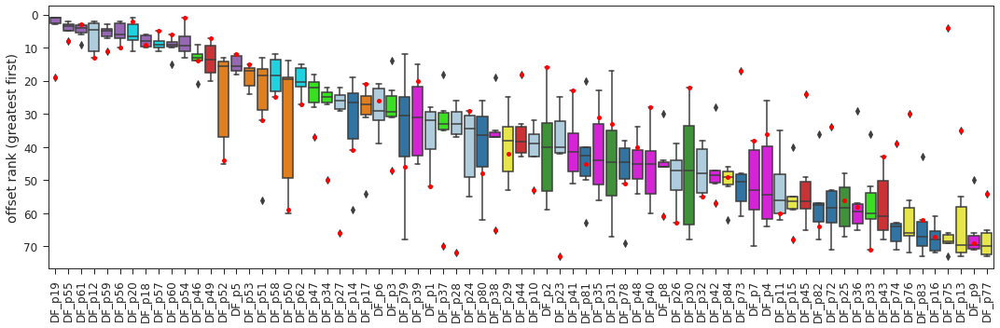

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_canonical_rcp85_2050s_gf_rona_circos.pdf


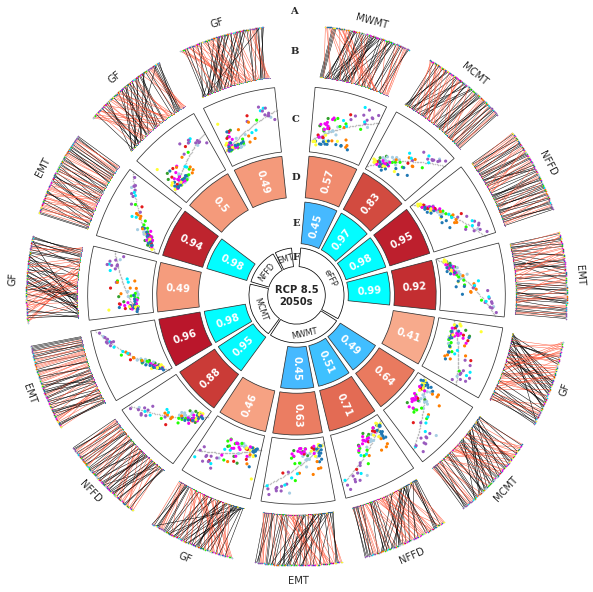

Function `make_circos` completed after : 0-00:03:56
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/combined_canonical_rcp85_2050s_gf_rona_circos_data.txt
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_canonical_rcp85_2050s_gf_rona_boxplot.pdf


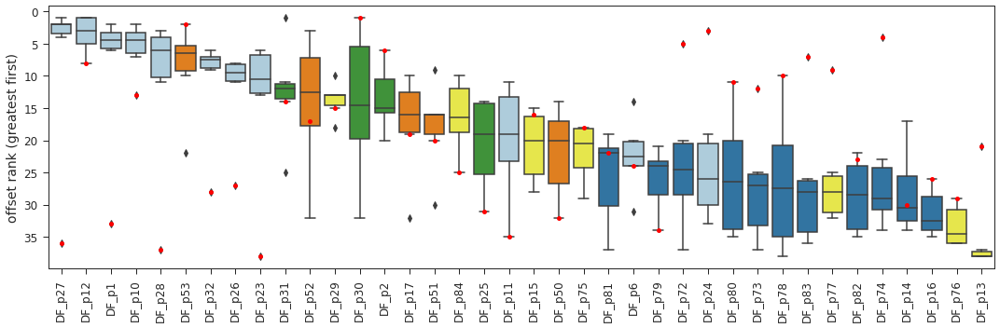

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_canonical_rcp85_2050s_gf_rona_circos.pdf


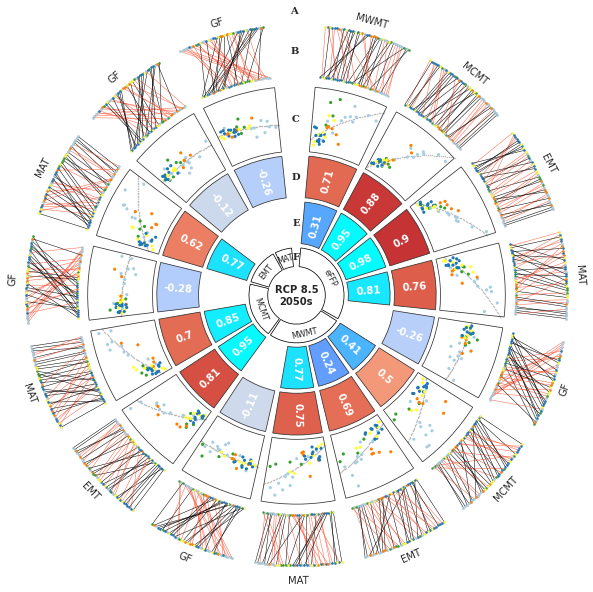

Function `make_circos` completed after : 0-00:02:26
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc_canonical_rcp85_2050s_gf_rona_circos_data.txt
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_canonical_rcp85_2050s_gf_rona_boxplot.pdf


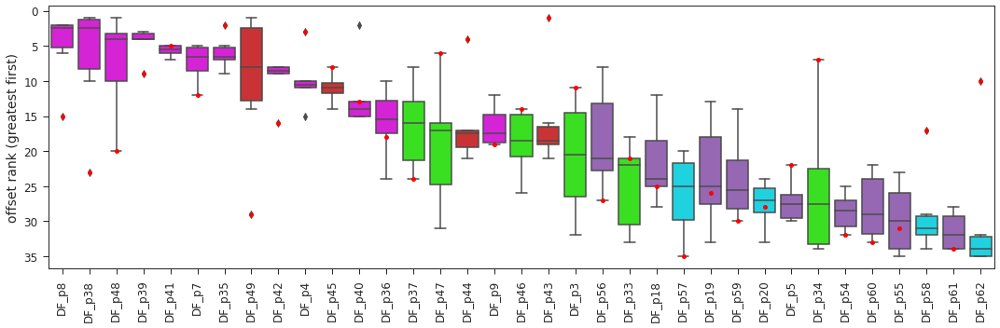

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_canonical_rcp85_2050s_gf_rona_circos.pdf


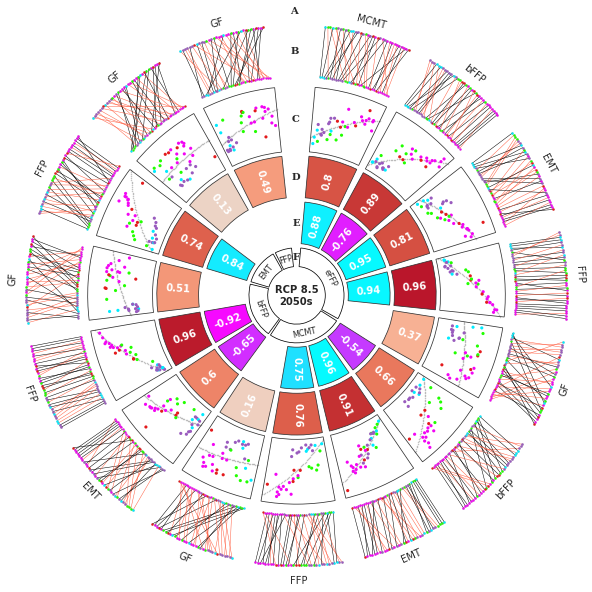

Function `make_circos` completed after : 0-00:02:19
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi_canonical_rcp85_2050s_gf_rona_circos_data.txt
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_canonical_rcp85_2050s_gf_rona_boxplot.pdf


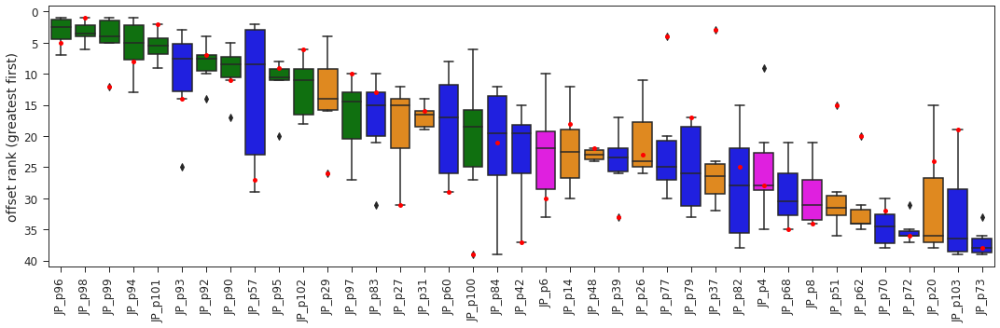

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_canonical_rcp85_2050s_gf_rona_circos.pdf


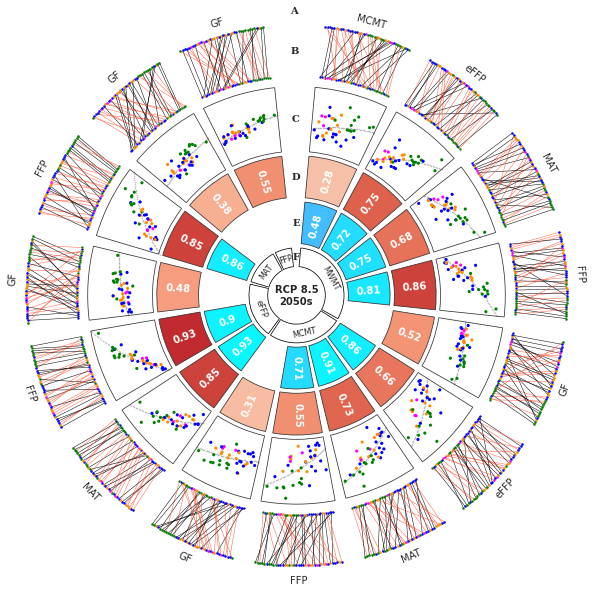

Function `make_circos` completed after : 0-00:02:31
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/jp_canonical_rcp85_2050s_gf_rona_circos_data.txt
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-combined_canonical_rcp85_2050s_gf_rona_boxplot.pdf


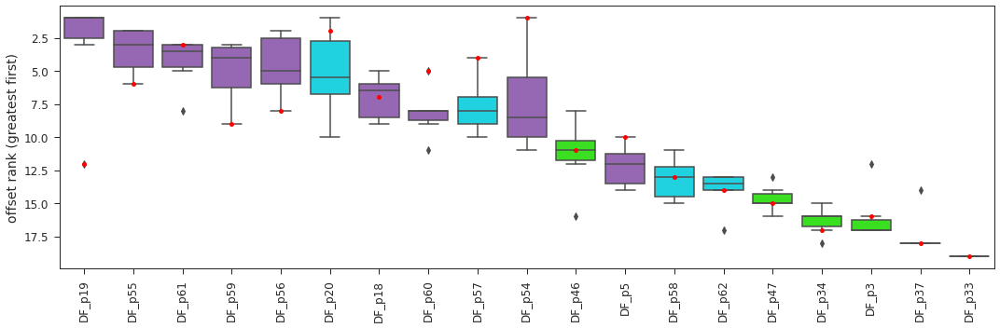

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-combined_canonical_rcp85_2050s_gf_rona_circos.pdf


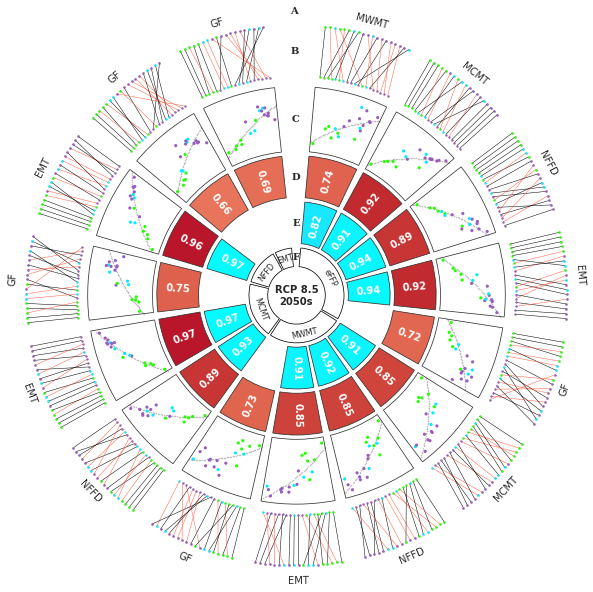

Function `make_circos` completed after : 0-00:01:39
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-combined_canonical_rcp85_2050s_gf_rona_circos_data.txt
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-combined_canonical_rcp85_2050s_gf_rona_boxplot.pdf


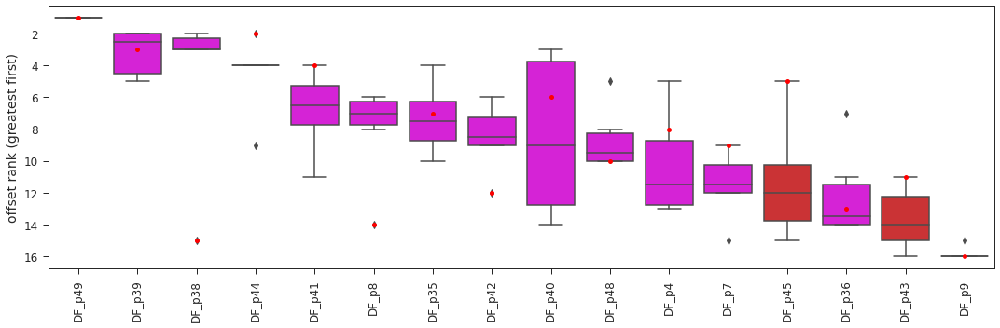

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-combined_canonical_rcp85_2050s_gf_rona_circos.pdf


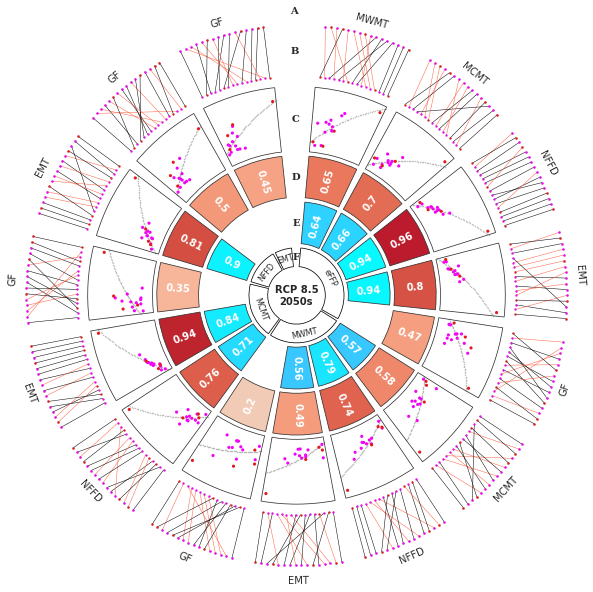

Function `make_circos` completed after : 0-00:01:31
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-combined_canonical_rcp85_2050s_gf_rona_circos_data.txt
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc-combined_canonical_rcp85_2050s_gf_rona_boxplot.pdf


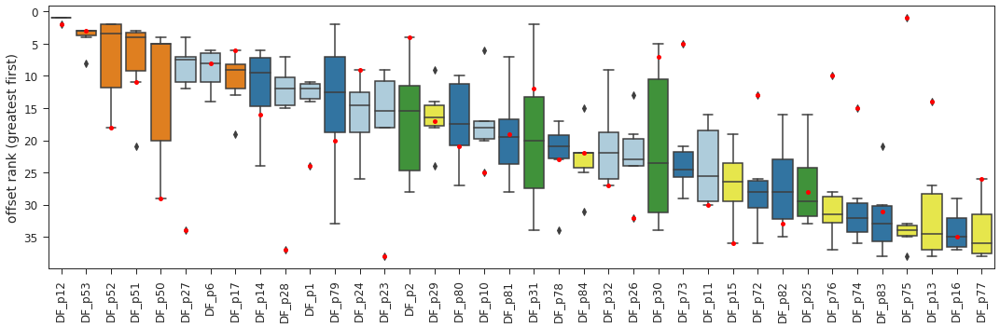

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc-combined_canonical_rcp85_2050s_gf_rona_circos.pdf


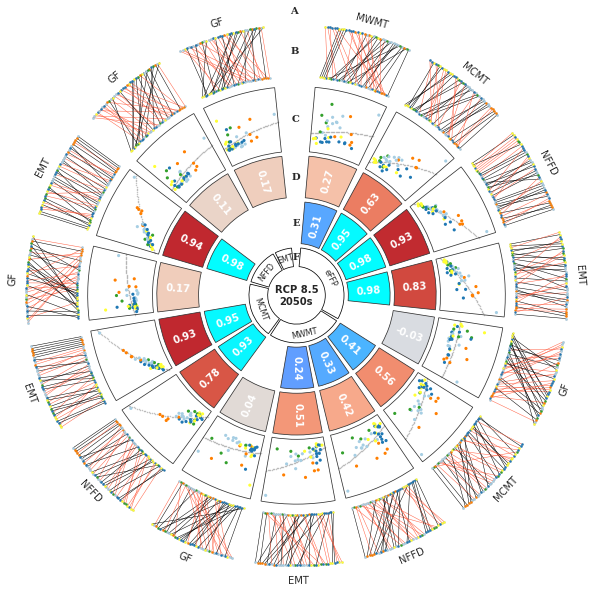

Function `make_circos` completed after : 0-00:02:26
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdc-combined_canonical_rcp85_2050s_gf_rona_circos_data.txt
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi-combined_canonical_rcp85_2050s_gf_rona_boxplot.pdf


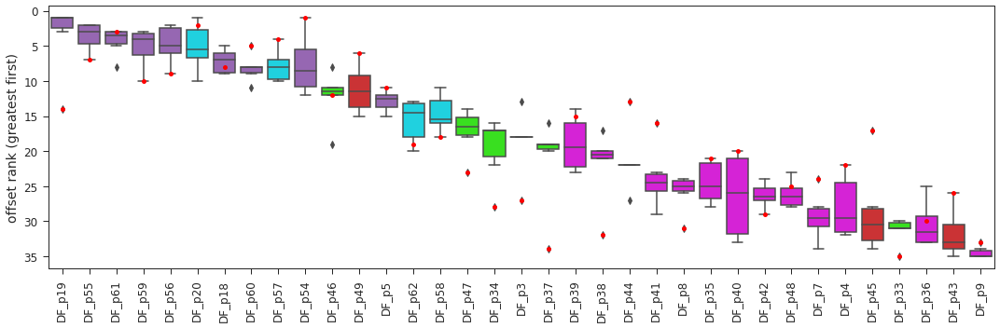

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi-combined_canonical_rcp85_2050s_gf_rona_circos.pdf


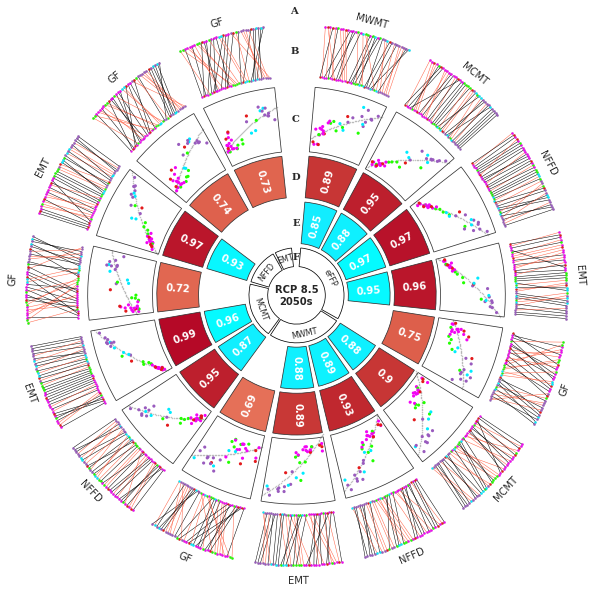

Function `make_circos` completed after : 0-00:02:19
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/fdi-combined_canonical_rcp85_2050s_gf_rona_circos_data.txt
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-fdi_canonical_rcp85_2050s_gf_rona_boxplot.pdf


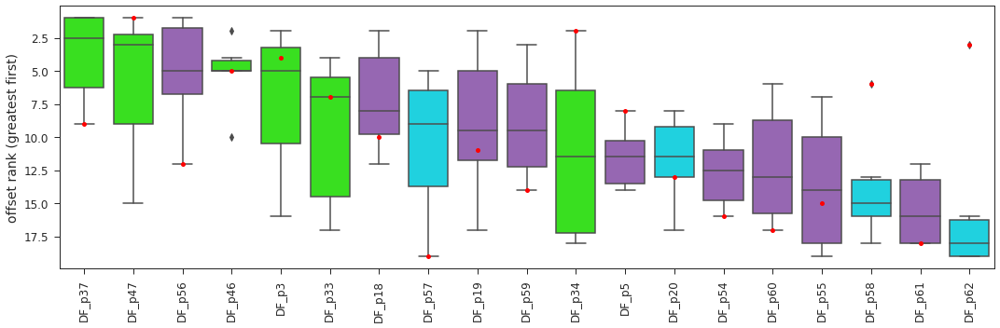

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-fdi_canonical_rcp85_2050s_gf_rona_circos.pdf


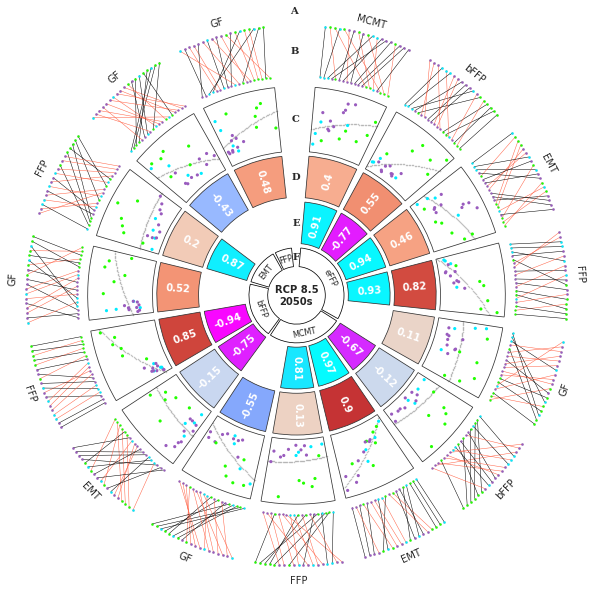

Function `make_circos` completed after : 0-00:01:40
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/eastern-fdi_canonical_rcp85_2050s_gf_rona_circos_data.txt
Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-fdi_canonical_rcp85_2050s_gf_rona_boxplot.pdf


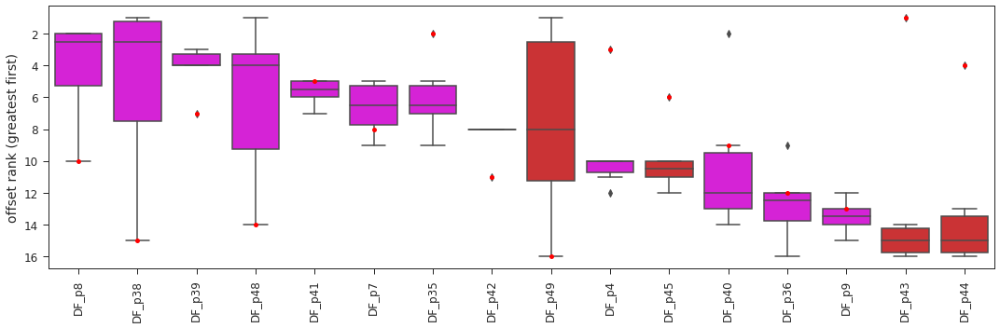

Saved to:  /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-fdi_canonical_rcp85_2050s_gf_rona_circos.pdf


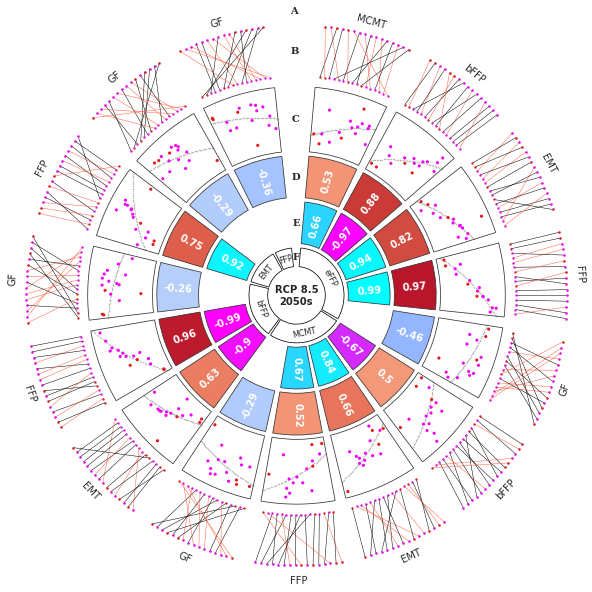

Function `make_circos` completed after : 0-00:01:31
file = /data/projects/pool_seq/phenotypic_data/offset_misc_files/results/rona/figs/western-fdi_canonical_rcp85_2050s_gf_rona_circos_data.txt


In [36]:
# create correlation heatmaps and circos figs that combine rona and gf
for (spp, rcp), gf_offset in unwrap_dictionary(gf_offsets):
    if rcp != 'rcp85_2050s':
        continue
    
#    if any(['eastern' in spp, 'western' in spp]) is False:
#        continue
#     if spp == 'combined':
#         continue
    
    # get GF data
    gf_offset_vals = gf_offset[gf_offset.columns[-1]].copy()
    gf_offset_vals.name = 'GF'

    # a list of envs to iterate
    sig_env_dict = {
        'canonical': canonical_efs[spp][f'NA_ENSEMBLE_{rcp}'],
        'cbst': cbst_envs[spp],
        'prov': prov_envs[spp]
    }

    for source, sig_envs in sig_env_dict.items():
        if source != 'canonical':
            continue
            
        # get RONA estimates for each of the environments in `sig_envs`
        offset_data = []
        for env in sig_envs:
            series = myrona[spp][env][f'NA_ENSEMBLE_{rcp}'].copy()
            series.name = env
            offset_data.append(series)

        # add GF data
        offset_data.append(gf_offset_vals)
        
        # create rank boxplot
        boxplot_fig = op.join(figdir, f'{spp}_{source}_{rcp}_gf_rona_boxplot.pdf')
        rank_boxplot(offset_data, saveloc=boxplot_fig)
        
#         # create correlation heatmap across RONA and GF estimates
#         plt.figure(figsize=(7, 7))
#         ax = rcp_heatmap(offset_data, rcp, vmin=-1, vmax=1, cbar=True, use_gridspec=False,
#                          pad=-0.08, anchor=(0, 0.18), shrink=0.76,
#                          saveloc=op.join(figdir, f'{spp}_{source}_{rcp}_gf_rona_heat_map.pdf'))
        
        # set up circos plot input (transpose so source are columns pops are rows)
        df = pd.DataFrame(offset_data).T
        # determine order to plot envs by how long their name is (GF is always last)
        col_order = pd.Series(dtype=str)
        for col in df.columns:
            col_order.loc[col] = len(col)
        cols = col_order.sort_values(ascending=False).index.tolist()
        
        # create circos fig with slope graph
        circos_fig = boxplot_fig.replace('_boxplot.pdf', '_circos.pdf')
        make_circos(spp, df[cols], rcp=f'NA_ENSEMBLE_{rcp}',
                    saveloc=circos_fig)
        
#         # create circos fig without slope graph
#         circos_fig2 = circos_fig.replace('.pdf', '_without-slopegraph.pdf')
# #         make_circos(spp, df[cols], rcp=f'NA_ENSEMBLE_{rcp}', add_slopegraph=False,
# #                     saveloc=circos_fig2)
        
        # save dataframe for supp mat
        file = circos_fig.replace('.pdf', '_data.txt')
        print(ColorText(f'file = ').bold().__str__() + file)
        df.to_csv(file, sep='\t', index=True, header=True)
        

In [37]:
# # create dataframe with all data
# # these show correlation between GF offset and that predicted from RONA for a given RONA env
# # NAs exist because not every env was sig different between current and future climates
#     # (this is how I chose envs for RONA)
# spp_dfs = defaultdict(list)
# for spp in corrs.keys():
#     for rcp in corrs[spp].keys():
#         data = corrs[spp][rcp]
#         spp_dfs[spp].append(pd.DataFrame(data, index=[rcp]))

# # show dataframes for each species, print min and max corr between RONA and GF for rcp4.5 2050s
# rcp = 'rcp45_2050s'
# for spp,dfs in spp_dfs.items():
#     print(ColorText(spp).bold())
#     df = pd.concat(dfs, axis=0)
#     minn = df.loc[rcp].min()
#     maxx = df.loc[rcp].max()
#     print('\t', f'{rcp} min = ', round(minn, 4))
#     print('\t', f'{rcp} max = ', round(maxx, 4))
#     display(df)
    

In [38]:
# how long did it take to make all them figs?
formatclock(dt.now() - t1, exact=True)

'0-00:25:26'

[top](#home)